<h1 align="center",style="color:Black">Telecom Churn Case Study</h1>
<hr/>

<h3 align="center",style="color:Grey;">By -: <a href=https:"//www.linkedin.com/in/gadapotigowthami/">Gowthami Gadapoti </a> & <a href="https://www.linkedin.com/in/maheshbabu1/">Mahesh Babu R </a></h3>

<h2>Business problem overview</h2>

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

 

For many incumbent operators, retaining high profitable customers is the number one business goal.

<img src="https://cyfuture.com/images/telecom-bg.jpg" alt="Telecom Industry" width="700" height="1000">
To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

 

In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

<h2>High-value churn</h2>

In the Indian and the Southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.


In this project, we  will define high-value customers based on a certain metric (mentioned later below) and predict churn only on high-value customers.

In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

#Importing Libraries
import pandas as pd
import numpy as np
import seaborn as sns

# For Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


# To get all columns in tabular form
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

## 1-A.Data Exploration

In [2]:
df=pd.read_csv('telecom_churn_data.csv')
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [3]:
# Reading the data dictionary file
df_structure = pd.read_excel('Data+Dictionary-+Telecom+Churn+Case+Study.xlsx')
# need this for just one cell
with pd.option_context('display.max_colwidth', None):
    display(df_structure)

,Acronyms,Descriptions
0,MOBILE_NUMBER,Customer phone number
1,CIRCLE_ID,Telecom circle area to which the customer belongs to
2,LOC,Local calls - within same telecom circle
3,STD,STD calls - outside the calling circle
4,IC,Incoming calls
5,OG,Outgoing calls
6,T2T,"Operator T to T, i.e. within same operator (mobile to mobile)"
7,T2M,Operator T to other operator mobile
8,T2O,Operator T to other operator fixed line
9,T2F,Operator T to fixed lines of T


In [4]:
# The .info() code gives almost the entire information that needs to be inspected
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [5]:
# The .shape code gives the no. of rows and columns
df.shape

(99999, 226)

In [6]:
#To get an idea of the numeric values, use .describe()
df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [7]:
#To get an idea of the features and their data types if need to be changed any, use .dtypes()
df.dtypes

mobile_number                 int64
circle_id                     int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6         object
last_date_of_month_7         object
last_date_of_month_8         object
last_date_of_month_9         object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8               float64
roam_ic_mou_9               float64
roam_og_mou_6               float64
roam_og_mou_7               float64
roam_og_mou_8               

In [8]:
# Duplicates check
df.loc[df.duplicated()]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g


## 1-B. Missing Value Treatment

In [9]:
# Checking the percentage of missing values
round(100*(df.isnull().sum()/len(df.index)), 2).sort_values(ascending=False)

count_rech_2g_6             74.85
date_of_last_rech_data_6    74.85
count_rech_3g_6             74.85
av_rech_amt_data_6          74.85
max_rech_data_6             74.85
total_rech_data_6           74.85
arpu_3g_6                   74.85
arpu_2g_6                   74.85
night_pck_user_6            74.85
fb_user_6                   74.85
arpu_3g_7                   74.43
count_rech_2g_7             74.43
fb_user_7                   74.43
count_rech_3g_7             74.43
arpu_2g_7                   74.43
av_rech_amt_data_7          74.43
max_rech_data_7             74.43
night_pck_user_7            74.43
total_rech_data_7           74.43
date_of_last_rech_data_7    74.43
night_pck_user_9            74.08
date_of_last_rech_data_9    74.08
fb_user_9                   74.08
arpu_2g_9                   74.08
max_rech_data_9             74.08
arpu_3g_9                   74.08
total_rech_data_9           74.08
av_rech_amt_data_9          74.08
count_rech_3g_9             74.08
count_rech_2g_

### High Value Customers based on given definition :
Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

In [10]:
# Average recharge amount for first two months i.e 6 and 7
# Removing negative values from the Average recharge amount for first two months with 0
# Replacing NaN's with 0
df['arpu_6_7'] = (df['arpu_6'].fillna(0) + df['arpu_7'].fillna(0))/2
cut_off=df[df['arpu_6_7']>= 0]['arpu_6_7'].quantile(0.70)
print("\nThe 70th quantile value to determine the High Value Customer is: ",cut_off,"\n")


The 70th quantile value to determine the High Value Customer is:  317.5723 



In [11]:
# Lets drop the original columns as they are derived to a new column for better understanding of the data
df.drop(['arpu_6','arpu_7'], axis=1, inplace=True)

In [12]:
# Selecting the columns to define churn variable (i.e. TARGET Variable)
df['churn_1']=df['total_ic_mou_9'].fillna(0) + df['total_og_mou_9'].fillna(0)+df['vol_2g_mb_9'].fillna(0) + df['vol_3g_mb_9'].fillna(0)


# Initializing the churn variable.
df['churn']=0

# Imputing the churn values based on the condition
df['churn'] = np.where(df['churn_1'] == 0, 1, 0)

df=df.drop(['churn_1'],1)

df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_6_7,churn
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252

In [13]:
#Removing all columns for the Month 9 has this is the churn phase and cannot be used in training the data
columns_to_delete = [x for x in df.columns if x.endswith('_9')]
df = df.drop(columns_to_delete,axis=1)

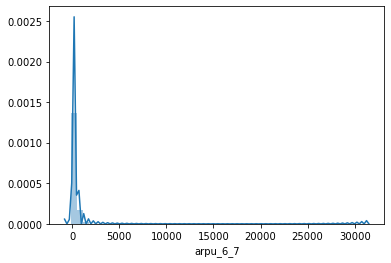

In [14]:
# Visualizing the column created
sns.distplot(df['arpu_6_7'])
plt.show()

In [15]:
# Filtering the data to the top 30% considered as High Value Customer
df = df[df['arpu_6_7'] >= cut_off]

In [16]:
# The curent dimension of the dataset
df.shape

(29964, 172)

In [17]:
# Columns with constant value
variance_low=df.loc[:,df.apply(pd.Series.nunique) == 1].columns
df = df.drop(variance_low,axis=1)

In [18]:
# The curent dimension of the dataset
df.shape

(29964, 159)

In [19]:
# Checking the percentage of missing values
round(100*(df.isnull().sum()/len(df.index)), 2).sort_values(ascending=False)

night_pck_user_6            61.52
arpu_2g_6                   61.52
av_rech_amt_data_6          61.52
date_of_last_rech_data_6    61.52
arpu_3g_6                   61.52
total_rech_data_6           61.52
count_rech_3g_6             61.52
fb_user_6                   61.52
count_rech_2g_6             61.52
max_rech_data_6             61.52
count_rech_3g_7             60.74
arpu_2g_7                   60.74
count_rech_2g_7             60.74
av_rech_amt_data_7          60.74
max_rech_data_7             60.74
night_pck_user_7            60.74
total_rech_data_7           60.74
fb_user_7                   60.74
arpu_3g_7                   60.74
date_of_last_rech_data_7    60.74
arpu_2g_8                   60.35
av_rech_amt_data_8          60.35
arpu_3g_8                   60.35
count_rech_2g_8             60.35
night_pck_user_8            60.35
count_rech_3g_8             60.35
max_rech_data_8             60.35
total_rech_data_8           60.35
fb_user_8                   60.35
date_of_last_r

In [20]:
#Dropping the columns with more than 30% missing values

missing = round(100*(df.isnull().sum()/len(df.index)),2)
missing_col = missing[missing > 30].index
df = df.drop(missing_col,axis=1)

# The curent dimension of the dataset
df.shape

(29964, 129)

In [21]:
df.head()

,mobile_number,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_6_7,churn
7,7000701601,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1209.5150,1
8,7001524846,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,6/25/2014,7/31/2014,8/30/2014,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0.0,435.4720,0
13,7002191713,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,6/20/2014,7/22/2014,8/30/2014,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0.0,349.2585,0
16,7000875565,187.894,50.51,74.01,70.61,296.29,229.74,1

In [22]:
# Checking the percentage of missing values in rows
round(100*(df.isnull().sum(axis=1)/ len(df.columns)), 2).sort_values(ascending=False)

43390    65.12
2470     65.12
43885    65.12
86286    65.12
57826    65.12
15450    65.12
94482    64.34
3506     64.34
5983     64.34
69970    64.34
57525    64.34
46858    64.34
30946    64.34
14761    64.34
52138    64.34
53460    64.34
97762    64.34
74778    64.34
78977    64.34
33018    64.34
80932    64.34
48177    64.34
4190     64.34
30548    64.34
37867    63.57
19971    63.57
90676    63.57
40855    63.57
64474    63.57
77071    63.57
30713    63.57
41228    63.57
14191    63.57
11626    63.57
72112    63.57
91585    63.57
72517    62.79
90792    62.79
86046    62.79
34137    62.79
53060    62.79
61090    62.79
42188    62.79
90780    62.79
44622    62.79
36927    62.79
86045    62.79
2185     62.79
36350    62.79
41571    62.79
44287    62.79
36807    62.79
98943    62.79
90850    62.79
19531    62.79
75929    62.79
25647    62.79
63576    62.79
74558    62.79
10879    62.79
43348    62.79
88435    62.79
35260    62.79
88955    62.79
62706    62.79
24091    62.79
87246    6

In [23]:
#Dropping the rows with more than 25% missing values

missing = round(100*(df.isnull().sum(axis=1)/len(df.columns)),2)
missing_row = missing[missing > 25].index
df = df.drop(missing_row,axis=0)

# The curent dimension of the dataset
df.shape

(29647, 129)

In [24]:
# Separating numerical and categorical fields for analysisng them separately
num_col = df.select_dtypes("number").columns
cat_col = df.select_dtypes("object").columns

# create column name list by types of columns
id_cols = ['mobile_number']


# drop id and date columns
print("Shape before dropping: ", df.shape)
df = df.drop(id_cols, axis=1)
df = df.drop(cat_col, axis=1)
print("Shape after dropping: ", df.shape)

Shape before dropping:  (29647, 129)
Shape after dropping:  (29647, 125)


In [25]:
df.fillna(df.median(),inplace=True)

In [26]:
df.isna().sum().sort_values(ascending=False).head()

churn               0
spl_og_mou_8        0
std_og_t2m_mou_7    0
std_og_t2m_mou_8    0
std_og_t2f_mou_6    0
dtype: int64

In [27]:
# We have a column called 'aon'
# we can derive new variables from this to explain the data w.r.t churn.
# creating a new variable 'tenure'
df['tenure'] = (df['aon']/30).round(0)

# Since we derived a new column from 'aon', we can drop it
df.drop('aon',axis=1, inplace=True)

In [28]:
df['tenure'].value_counts()

16.0     1428
7.0       799
12.0      779
10.0      767
11.0      749
9.0       738
8.0       734
15.0      640
13.0      622
17.0      605
24.0      562
14.0      554
22.0      538
122.0     532
18.0      507
21.0      505
20.0      490
6.0       475
19.0      469
25.0      440
26.0      424
23.0      420
27.0      415
28.0      401
34.0      388
36.0      368
32.0      368
29.0      366
31.0      356
79.0      330
30.0      329
38.0      308
33.0      307
35.0      305
37.0      293
40.0      290
41.0      251
43.0      247
45.0      246
46.0      244
39.0      242
44.0      235
104.0     230
42.0      230
48.0      214
56.0      198
84.0      196
51.0      195
47.0      194
50.0      193
87.0      193
80.0      191
52.0      190
91.0      187
57.0      186
85.0      178
92.0      173
82.0      173
78.0      172
49.0      172
76.0      162
86.0      157
96.0      156
93.0      156
66.0      153
103.0     152
60.0      150
94.0      150
97.0      148
58.0      147
83.0      147
88.0  

### Correlation

In [29]:
cor_matrix = df.corr().abs()
print(cor_matrix)

upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
print(upper_tri)

to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.85)]
print("columns to drop from the dataset",to_drop)

                      arpu_8  onnet_mou_6  onnet_mou_7  onnet_mou_8  \
arpu_8              1.000000     0.088999     0.183433     0.308621   
onnet_mou_6         0.088999     1.000000     0.724100     0.593005   
onnet_mou_7         0.183433     0.724100     1.000000     0.793313   
onnet_mou_8         0.308621     0.593005     0.793313     1.000000   
offnet_mou_6        0.207729     0.002639     0.038653     0.019927   
offnet_mou_7        0.321154     0.055332     0.001900     0.009900   
offnet_mou_8        0.480832     0.043041     0.002129     0.056777   
roam_ic_mou_6       0.067037     0.002395     0.015824     0.030272   
roam_ic_mou_7       0.065170     0.010452     0.007354     0.005708   
roam_ic_mou_8       0.100922     0.030553     0.022925     0.008715   
roam_og_mou_6       0.106291     0.051998     0.055993     0.075289   
roam_og_mou_7       0.124243     0.056588     0.046869     0.063260   
roam_og_mou_8       0.188708     0.056611     0.066588     0.076806   
loc_og

#### Drop the columns having high percentage Correlation

In [30]:
df1 = df.drop(to_drop, axis=1)
df1.shape

(29647, 112)

In [31]:
# To check for count of dtypes
df1.dtypes.value_counts()

float64    88
int64      23
int32       1
dtype: int64

*Here there is no categorical variables.*

### Handling outliers

In [32]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%
df1.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_7,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn,tenure
count,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000,29647.000000
mean,536.249823,299.642452,306.324553,270.658795,423.938485,427.384947,382.979129,17.905134,13.678548,13.357407,29.899907,22.213359,21.519772,95.709812,96.674252,88.399431,184.059300,183.362320,171.460946,7.128935,7.245224,6.572441,1.598761,1.894504,1.743289,287.049889,287.342327,267.183208,205.010521,180.351807,2.092116,2.080281,1.795115,399.217054,417.084665,355.650168,2.207450,6.016401,7.538182,7.008425,0.732211,0.060548,0.061461,693.886244,713.781716,626.086741,69.919006,71.459295,67.648816,162.850730,164.302216,158.496967,16.061716,17.025349,15.175084,252.837474,16.499189,17.247139,15.338254,32.637112,34.039031,30.790911,2.940306,3.068529,2.739904,52.111854,54.370428,49.033303,0.067297,0.017963,0.027913,11.236097,12.522480,11.856287,1.218452,1.479682,1.261069,12.215570,12.032212,10.388437,691.936351,690.197659,166.874524,170.113907,165.279084,101.603872,100.250312,96.261713,79.679687,79.071291,70.576081,254.722417,

In [33]:
# finding IQR for all columns
Q1 = df1.quantile(0.25)
Q3 = df1.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

arpu_8                380.558
onnet_mou_6           313.835
onnet_mou_7           318.090
onnet_mou_8           264.740
offnet_mou_6          384.150
offnet_mou_7          396.135
offnet_mou_8          376.010
roam_ic_mou_6           0.000
roam_ic_mou_7           0.000
roam_ic_mou_8           0.000
roam_og_mou_6           0.000
roam_og_mou_7           0.000
roam_og_mou_8           0.000
loc_og_t2t_mou_6       84.210
loc_og_t2t_mou_7       83.155
loc_og_t2t_mou_8       78.185
loc_og_t2m_mou_6      210.560
loc_og_t2m_mou_7      206.265
loc_og_t2m_mou_8      197.275
loc_og_t2f_mou_6        5.340
loc_og_t2f_mou_7        5.460
loc_og_t2f_mou_8        4.770
loc_og_t2c_mou_6        0.000
loc_og_t2c_mou_7        0.110
loc_og_t2c_mou_8        0.050
loc_og_mou_6          322.325
loc_og_mou_7          320.015
loc_og_mou_8          303.475
std_og_t2m_mou_6      213.180
std_og_t2m_mou_8      164.205
std_og_t2f_mou_6        0.000
std_og_t2f_mou_7        0.000
std_og_t2f_mou_8        0.000
std_og_mou

In [34]:
# applying upper capping for the colummns having extreme values 
cols=df1.columns
treat=[]
for x in cols:
    Q1 = df1[x].quantile(0.25)
    Q3 = df1[x].quantile(0.75)
    IQR = Q3 - Q1
    if df[x].max()>(Q3+1.5*IQR):
        treat.append(x)
    else :
        continue
print(treat)

['arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'loc_ic_mou_7',

In [35]:
def upper_range_out(df, col):
    
    Q1 = df[col].quantile(0.25)

    Q3 = df[col].quantile(0.75)

    IQR = Q3 - Q1

    higher_cap = Q3+1.5*IQR

    df.loc[(df[col] > higher_cap), col] = higher_cap
    
    return df


for col in treat:
    upper_range_out(df, col)

In [36]:
df1.shape

(29647, 112)

The total number of customers is now limited as above (i.e.,29647) who lies under the High Value customer criteria based upon which the model is built.

## Deriving churn

In [37]:
# lets find out churn/non churn percentage
print((df1['churn'].value_counts()/len(df))*100)
((df1['churn'].value_counts()/len(df))*100)
plt.show()

0    91.715857
1     8.284143
Name: churn, dtype: float64


Here 'churn' is the target variable. So all the columns related to this variable(i.e. all columns with suffix _9) can be dropped forn the dataset.

##  Exploratory Data analysis

In [38]:
# create plotting functions
def data_type(variable):
    if variable.dtype == np.int64 or variable.dtype == np.float64:
        return 'numerical'
    elif variable.dtype == 'category':
        return 'categorical'
    
def univariate(variable, stats=True):
    
    if data_type(variable) == 'numerical':
        sns.distplot(variable)
        if stats == True:
            print(variable.describe())
    
    elif data_type(variable) == 'categorical':
        sns.countplot(variable)
        if stats == True:
            print(variable.value_counts())
            
    else:
        print("Invalid variable passed: either pass a numeric variable or a categorical vairable.")
        
def bivariate(var1, var2):
    if data_type(var1) == 'numerical' and data_type(var2) == 'numerical':
        sns.regplot(var1, var2)
    elif (data_type(var1) == 'categorical' and data_type(var2) == 'numerical') or (data_type(var1) == 'numerical' and data_type(var2) == 'categorical'):        
        sns.boxplot(var1, var2)

count    29647.000000
mean       536.249823
std        493.025359
min       -945.808000
25%        291.868000
50%        453.860000
75%        672.426000
max      33543.624000
Name: arpu_8, dtype: float64


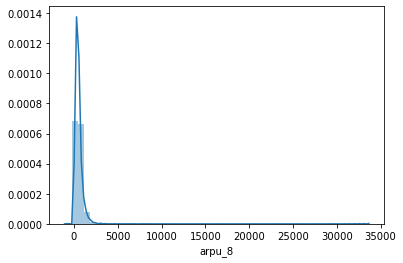

In [39]:
# Checking the distribution of the arpu_6 variable
univariate(df1.arpu_8)

count    29647.000000
mean       270.658795
std        465.944126
min          0.000000
25%         32.935000
50%        105.610000
75%        297.675000
max      10752.560000
Name: onnet_mou_8, dtype: float64


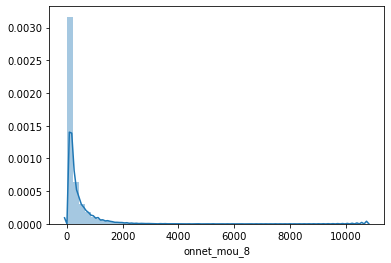

In [40]:
# Checking the distribution of the onnet_mou_8 variable
univariate(df1.onnet_mou_8)

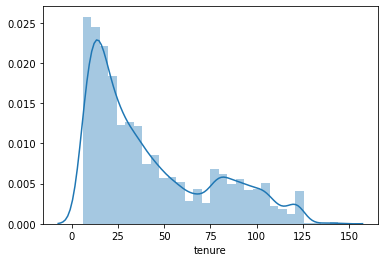

In [41]:
# Checking the distribution of the tenure variable

sns.distplot(df1['tenure'],bins=30)
plt.show()

In [42]:
# Binning the tenure variable for visuvalization
tn_range = [0, 6, 12, 24, 60, 61]
tn_label = [ '0-6 Months', '6-12 Months', '1-2 Yrs', '2-5 Yrs', '5 Yrs and above']
df1['tenure_range'] = pd.cut(df1['tenure'], tn_range, labels=tn_label)
df1['tenure_range'].head()

7         2-5 Yrs
8     6-12 Months
13            NaN
16        1-2 Yrs
17        1-2 Yrs
Name: tenure_range, dtype: category
Categories (5, object): [0-6 Months < 6-12 Months < 1-2 Yrs < 2-5 Yrs < 5 Yrs and above]

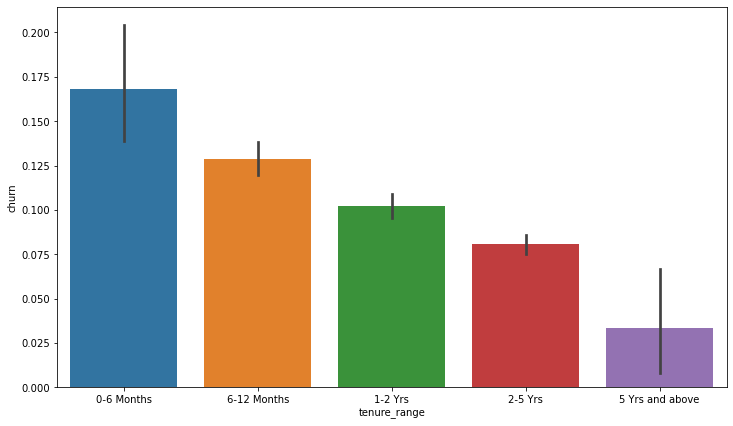

In [43]:
# Plotting a bar plot for tenure range
plt.figure(figsize=[12,7])
sns.barplot(x='tenure_range',y='churn', data=df1)
plt.show()

Text(0.5, 1.0, 'Features Correlating with Churn variable')

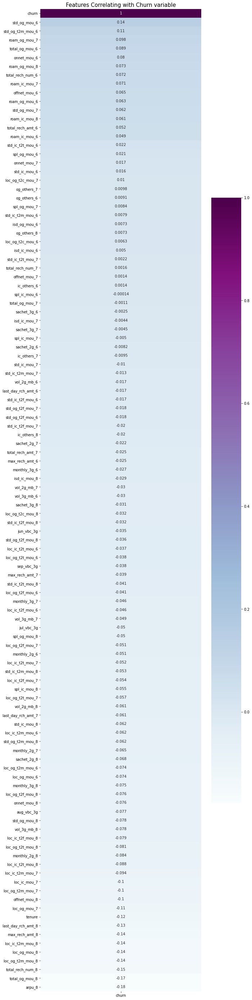

In [44]:
# Checking Correlation between target variable(SalePrice) with the other variable in the dataset
plt.figure(figsize=(10,50))
heatmap_churn = sns.heatmap(df1.corr()[['churn']].sort_values(ascending=False, by='churn'),annot=True, 
                                cmap='BuPu')
heatmap_churn.set_title("Features Correlating with Churn variable", fontsize=15)

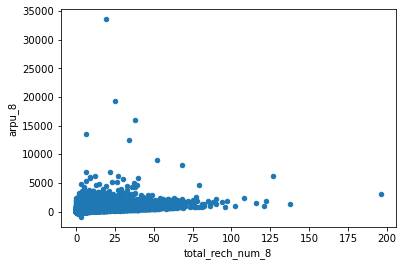

In [45]:
# lets now draw a scatter plot between total recharge and avg revenue for the 8th month
df1[['total_rech_num_8', 'arpu_8']].plot.scatter(x = 'total_rech_num_8',
                                                              y='arpu_8')
plt.show()

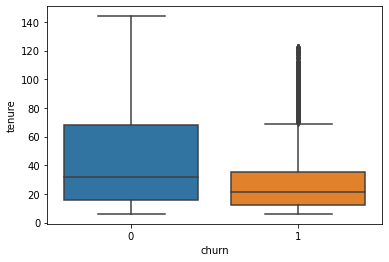

In [46]:
# Visualizing the columns tenure and churn using box plot
sns.boxplot(x = df1.churn, y = df1.tenure)

plt.show()

In [47]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
dummy = pd.get_dummies(df1[['tenure_range']], drop_first=True)
dummy.head()

,tenure_range_6-12 Months,tenure_range_1-2 Yrs,tenure_range_2-5 Yrs,tenure_range_5 Yrs and above
7,0,0,1,0
8,1,0,0,0
13,0,0,0,0
16,0,1,0,0
17,0,1,0,0


In [48]:
# Adding the results to the master dataframe
df1= pd.concat([df1, dummy], axis=1)
df1.head()

,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_7,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn,tenure,tenure_range,tenure_range_6-12 Months,tenure_range_1-2 Yrs,tenure_range_2-5 Yrs,tenure_range_5 Yrs and above
7,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,49.89,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,355.23,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,57.74,19.38,18.74,0.0,1,27.0,2-5 Yrs,0,0,1,0
8,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,13.69,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,23.83,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,21.03,910.65,122.16,0.0,0,10.0,6-12 Months,1,0,0,0
13,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,255.36,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,26.11,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,110,110,130,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,0.00,0.00,0.00,0.0,0,87.0,NaN,0,0,0,0
16,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,65.16,67.38,273.29,145.99,128.28,0.00,4.48,10.26,0.0,0.0,0.00,315.91,215.64,205.93,22.99,18.29,0.00,0.00,0.00,30.89,67.09,21.53,0.0,0.00,3.26,5.91,0.00,0.0,0.0,346.81,286.01,233.38,41.33,71.44,28.89,226.81,149.69,150.16,8.71,8.68,32.71,229.83,68.79,78.64,6.33,18.68,73.08,73.93,0.51,0.00,2.18,87.99,151.73,82.44,0.00,0.0,0.0,0.00,0.00,0.23,0.00,0.00,0.00,10,6,2,570,348,110,110,130,100,100,130,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,

In [49]:
# Dropping unwanted columns
df1.drop(['tenure_range','tenure'], axis=1, inplace=True)

## Modelling without PCA

### Test-Train Split

In [50]:
# Importing necessary libraries for Model creation
from sklearn.model_selection import train_test_split

In [51]:
# Creating a copy of the filtered dataframe

df_new = df1[:].copy()

In [52]:
df_new.to_csv('cleaned_file.csv')

In [53]:
# The curent dimension of the dataset after dropping few unwanted columns
df_new.shape

(29647, 115)

In [54]:
# Putting feature variable to X
X = df_new.drop(['churn'], axis=1)

X.head()

,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_7,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,tenure_range_6-12 Months,tenure_range_1-2 Yrs,tenure_range_2-5 Yrs,tenure_range_5 Yrs and above
7,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,49.89,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,355.23,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,57.74,19.38,18.74,0.0,0,0,1,0
8,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,13.69,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,23.83,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,21.03,910.65,122.16,0.0,1,0,0,0
13,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,255.36,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,26.11,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,110,110,130,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,0.00,0.00,0.00,0.0,0,0,0,0
16,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,65.16,67.38,273.29,145.99,128.28,0.00,4.48,10.26,0.0,0.0,0.00,315.91,215.64,205.93,22.99,18.29,0.00,0.00,0.00,30.89,67.09,21.53,0.0,0.00,3.26,5.91,0.00,0.0,0.0,346.81,286.01,233.38,41.33,71.44,28.89,226.81,149.69,150.16,8.71,8.68,32.71,229.83,68.79,78.64,6.33,18.68,73.08,73.93,0.51,0.00,2.18,87.99,151.73,82.44,0.00,0.0,0.0,0.00,0.00,0.23,0.00,0.00,0.00,10,6,2,570,348,110,110,130,100,100,130,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0.00,2.45,21.89,0.0,0,1,0,0
17,25.499,1185.91,9.28,7.79,61.64,0.00,5.

In [55]:
# Putting response variable to y
y = df_new['churn']

y.head()

7     1
8     0
13    0
16    0
17    0
Name: churn, dtype: int32

In [56]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [57]:
print("Dimension of X_train:", X_train.shape)
print("Dimension of X_test:", X_test.shape)

Dimension of X_train: (20752, 114)
Dimension of X_test: (8895, 114)


### Feature Scaling

In [58]:
X_train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20752 entries, 3939 to 18866
Data columns (total 114 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   arpu_8                        float64
 1   onnet_mou_6                   float64
 2   onnet_mou_7                   float64
 3   onnet_mou_8                   float64
 4   offnet_mou_6                  float64
 5   offnet_mou_7                  float64
 6   offnet_mou_8                  float64
 7   roam_ic_mou_6                 float64
 8   roam_ic_mou_7                 float64
 9   roam_ic_mou_8                 float64
 10  roam_og_mou_6                 float64
 11  roam_og_mou_7                 float64
 12  roam_og_mou_8                 float64
 13  loc_og_t2t_mou_6              float64
 14  loc_og_t2t_mou_7              float64
 15  loc_og_t2t_mou_8              float64
 16  loc_og_t2m_mou_6              float64
 17  loc_og_t2m_mou_7              float64
 18  loc_og_t2m_mou_8      

In [59]:
nums_col = X_train.select_dtypes(include = ['int32','int64','float64']).columns.tolist()

In [60]:
# apply scaling on the dataset
# Importing necessary libraries for Model creation
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train[nums_col] = scaler.fit_transform(X_train[nums_col])

In [61]:
X_train.shape

(20752, 114)

### Data Imbalance Handling

In [62]:
# Importing necessary libraries for Model creation
from imblearn.over_sampling import RandomOverSampler, SMOTE

sm = SMOTE(random_state=42)
X_train_sm,y_train_sm = sm.fit_resample(X_train,y_train)

In [63]:
print("Dimension of X_train_sm Shape:", X_train_sm.shape)
print("Dimension of y_train_sm Shape:", y_train_sm.shape)

Dimension of X_train_sm Shape: (38038, 114)
Dimension of y_train_sm Shape: (38038,)


## Logistic Regression without PCA

### Feature Selection Using RFE

In [64]:
#  Importing necessary libraries for Model creation
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

#  Importing necessary libraries for Model creation
from sklearn.feature_selection import RFE

rfe = RFE(logreg, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train_sm, y_train_sm)

In [65]:
rfe.support_

array([ True, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False,  True, False, False,  True, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False,  True,  True,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False,  True, False, False,
        True, False, False,  True, False, False, False, False, False,
       False,  True, False, False, False, False])

In [66]:
len(X_train_sm)

38038

In [67]:
col = X_train_sm.columns[rfe.support_]
col

Index(['arpu_8', 'roam_og_mou_8', 'std_og_mou_7', 'total_og_mou_8',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8',
       'spl_ic_mou_8', 'total_rech_num_8', 'total_rech_amt_6',
       'last_day_rch_amt_8', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8',
       'sep_vbc_3g'],
      dtype='object')

In [68]:
list(zip(X_train_sm.columns, rfe.support_, rfe.ranking_))

[('arpu_8', True, 1),
 ('onnet_mou_6', False, 16),
 ('onnet_mou_7', False, 58),
 ('onnet_mou_8', False, 78),
 ('offnet_mou_6', False, 59),
 ('offnet_mou_7', False, 19),
 ('offnet_mou_8', False, 10),
 ('roam_ic_mou_6', False, 36),
 ('roam_ic_mou_7', False, 4),
 ('roam_ic_mou_8', False, 67),
 ('roam_og_mou_6', False, 87),
 ('roam_og_mou_7', False, 27),
 ('roam_og_mou_8', True, 1),
 ('loc_og_t2t_mou_6', False, 98),
 ('loc_og_t2t_mou_7', False, 71),
 ('loc_og_t2t_mou_8', False, 12),
 ('loc_og_t2m_mou_6', False, 62),
 ('loc_og_t2m_mou_7', False, 32),
 ('loc_og_t2m_mou_8', False, 5),
 ('loc_og_t2f_mou_6', False, 92),
 ('loc_og_t2f_mou_7', False, 55),
 ('loc_og_t2f_mou_8', False, 13),
 ('loc_og_t2c_mou_6', False, 30),
 ('loc_og_t2c_mou_7', False, 31),
 ('loc_og_t2c_mou_8', False, 61),
 ('loc_og_mou_6', False, 99),
 ('loc_og_mou_7', False, 42),
 ('loc_og_mou_8', False, 15),
 ('std_og_t2m_mou_6', False, 89),
 ('std_og_t2m_mou_8', False, 34),
 ('std_og_t2f_mou_6', False, 65),
 ('std_og_t2f_mou_7

In [69]:
X_train_sm.columns[~rfe.support_]

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7',
       'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'loc_og_t2t_mou_6',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6',
       'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6',
       'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7',
       'loc_og_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_8',
       'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8',
       'std_og_mou_6', 'std_og_mou_8', 'isd_og_mou_6', 'spl_og_mou_6',
       'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7',
       'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'loc_ic_t2t_mou_6',
       'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7',
       'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_mou_7',
       'std_ic_t2t_mou_

### Assessing the model with StatsModels
### Model A

In [70]:
len(X_train_sm)

38038

In [71]:
# Importing necessary libraries for Model creation
import statsmodels.api as sm

X_train_sm = sm.add_constant(X_train_sm[col])
# Logistic regression model
logm = sm.GLM(y_train_sm,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38038
Model:                            GLM   Df Residuals:                    38022
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15360.
Date:                Mon, 31 May 2021   Deviance:                       30720.
Time:                        22:31:34   Pearson chi2:                 4.89e+07
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.7289      0.093     18.625      0.000       1.547       1.911
arpu_8                -8.0151      1.875     -4.274      0.000     -11.691      -4.339
roam_og_mou_8          8.1106      0.620     13.092      0.000       6.896       9.325
std_og_mou_7          13.5655      0.453     29.970      0.000      12.678      14.453
total_og_mou_8       -28.7942      0.954    -30.188      0.000     -30.664     -26.925
loc_ic_t2t_mou_8     -18.0526      1.489    -12.124      0.000     -20.971     -15.134
loc_ic_t2m_mou_8     -11.7965      0.766    -15.407      0.000     -13.297     -10.296
loc_ic_t2f_mou_8     -21.0441      1.944    -10.824      0.000     -24.855     -17.233
spl_ic_mou_8         -41.0817      2.291    -17.930      0.000     -45.572     -36.591
total_rech_num_8     -10.0953      0.548    -18.423      0.000     -11.169      -9.021
total_rech_amt_6      13.4328      0.719     18.682      0.000      12.024      14.842
last_day_rch_amt_8   -21.5100      0.919    -23.405      0.000     -23.311     -19.709
monthly_2g_8          -9.6180      0.441    -21.824      0.000     -10.482      -8.754
sachet_2g_8           -8.0992      0.519    -15.606      0.000      -9.116      -7.082
monthly_3g_8         -18.8201      0.996    -18.901      0.000     -20.772     -16.869
sep_vbc_3g           -21.6282      2.427     -8.911      0.000     -26.385     -16.871
======================================================================================
"""

In [72]:
# checking VIF's
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = X_train_sm[col].columns
vif['VIF'] = [variance_inflation_factor(X_train_sm[col].values, i) for i in range(X_train_sm[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,arpu_8,8.98
9,total_rech_amt_6,4.08
8,total_rech_num_8,3.33
3,total_og_mou_8,3.18
2,std_og_mou_7,2.40
5,loc_ic_t2m_mou_8,1.86
10,last_day_rch_amt_8,1.64
4,loc_ic_t2t_mou_8,1.29
12,sachet_2g_8,1.23
1,roam_og_mou_8,1.20


In [73]:
# Since VIF value is high for arpu_8 we are droping it from list.
col = col.drop('arpu_8',1)

In [74]:
X_train_sm = sm.add_constant(X_train_sm[col])
# Logistic regression model
logm = sm.GLM(y_train_sm,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38038
Model:                            GLM   Df Residuals:                    38023
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15369.
Date:                Mon, 31 May 2021   Deviance:                       30738.
Time:                        22:31:35   Pearson chi2:                 7.29e+07
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.3646      0.035     38.698      0.000       1.296       1.434
roam_og_mou_8          6.9346      0.550     12.599      0.000       5.856       8.013
std_og_mou_7          13.9860      0.445     31.458      0.000      13.115      14.857
total_og_mou_8       -31.0505      0.800    -38.810      0.000     -32.619     -29.482
loc_ic_t2t_mou_8     -18.2416      1.493    -12.217      0.000     -21.168     -15.315
loc_ic_t2m_mou_8     -11.9748      0.766    -15.631      0.000     -13.476     -10.473
loc_ic_t2f_mou_8     -21.6182      1.951    -11.083      0.000     -25.441     -17.795
spl_ic_mou_8         -41.2261      2.301    -17.917      0.000     -45.736     -36.716
total_rech_num_8     -10.8983      0.518    -21.027      0.000     -11.914      -9.882
total_rech_amt_6      12.5964      0.687     18.348      0.000      11.251      13.942
last_day_rch_amt_8   -22.7775      0.878    -25.950      0.000     -24.498     -21.057
monthly_2g_8          -9.8544      0.438    -22.513      0.000     -10.712      -8.996
sachet_2g_8           -8.1226      0.519    -15.636      0.000      -9.141      -7.104
monthly_3g_8         -20.1448      0.952    -21.163      0.000     -22.010     -18.279
sep_vbc_3g           -22.6774      2.469     -9.185      0.000     -27.516     -17.838
======================================================================================
"""

In [75]:
vif = pd.DataFrame()
vif['Features'] = X_train_sm[col].columns
vif['VIF'] = [variance_inflation_factor(X_train_sm[col].values, i) for i in range(X_train_sm[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,total_og_mou_8,3.09
7,total_rech_num_8,2.70
8,total_rech_amt_6,2.38
1,std_og_mou_7,2.36
4,loc_ic_t2m_mou_8,1.78
9,last_day_rch_amt_8,1.51
3,loc_ic_t2t_mou_8,1.29
11,sachet_2g_8,1.23
5,loc_ic_t2f_mou_8,1.18
0,roam_og_mou_8,1.17


In [76]:
# Checking the predicted values on the train set
y_train_sm_pred = res.predict(X_train_sm)
y_train_sm_pred[:12]

0     0.777027
1     0.762382
2     0.015771
3     0.000295
4     0.000107
5     0.021570
6     0.040101
7     0.151332
8     0.247942
9     0.016116
10    0.794956
11    0.060314
dtype: float64

In [77]:
# Reshape of predicted values
y_train_sm_pred = y_train_sm_pred.values.reshape(-1)
len(y_train_sm_pred)

38038

In [78]:
y_train_sm_pred_final = pd.DataFrame({'Churn':y_train_sm.values, 'Churn_prob':y_train_sm_pred})
y_train_sm_pred_final.head()

,Churn,Churn_prob
0,0,0.777027
1,0,0.762382
2,0,0.015771
3,0,0.000295
4,0,0.000107


#### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [79]:
y_train_sm_pred_final['Churn_pred'] = y_train_sm_pred_final.Churn_prob.map(lambda x: 1 if x > 0.5 else 0)

# Viewing the prediction results
y_train_sm_pred_final.head()

,Churn,Churn_prob,Churn_pred
0,0,0.777027,1
1,0,0.762382,1
2,0,0.015771,0
3,0,0.000295,0
4,0,0.000107,0


In [80]:
#  Importing necessary libraries for Model creation
from sklearn import metrics

# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_pred )
print(confusion)

[[15439  3580]
 [ 2538 16481]]


In [81]:
# Predicted      not_churn    churn
# Actual
# not_churn        15439       3580
# churn             2538     16481

In [82]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_pred))

0.8391608391608392


#### Metrics beyond simply accuracy

In [83]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [84]:
print("Statistics for model at cutoff value for Converted_prob > 0.5")
print("")
# Let's check the overall accuracy.
print('Overall_Accuracy :{0}'.format(round(metrics.accuracy_score(y_train_sm_pred_final.Churn,
                                                                   y_train_sm_pred_final.Churn_pred),2)))

sensitivity = round(TP / float(TP+FN),2)
# Let's see the sensitivity of our logistic regression model
print('Sensitivity :{0}'.format(sensitivity))

specificity = round(TN / float(TN+FP),2)

# Let us calculate specificity
print('Specificity : {0}'.format(specificity))

# Calculate false postive rate - predicting lead when customer does not convert
print('False positive rate : {0}'.format(round(FP/ float(TN+FP),2)))

precision = round(TP / float(TP+FP),2)
# positive predictive value (Precision)
print ('Precision(Positive predictive Value) : {0}'.format(precision))

# Negative predictive value
print ('Negative predictive Value : {0}'.format(round(TN / float(TN+ FN),2)))

print("")

print("Sensitivity - Specificity : {0} , {1}".format(sensitivity,specificity))

print("Precision - Recall : {0} , {1}".format(precision,sensitivity))

print("F1 score is : {0} ".format(2*(precision*sensitivity)/(precision+sensitivity)))

Statistics for model at cutoff value for Converted_prob > 0.5

Overall_Accuracy :0.84
Sensitivity :0.87
Specificity : 0.81
False positive rate : 0.19
Precision(Positive predictive Value) : 0.82
Negative predictive Value : 0.86

Sensitivity - Specificity : 0.87 , 0.81
Precision - Recall : 0.82 , 0.87
F1 score is : 0.8442603550295857 


#### Plotting the ROC Curve

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [85]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [86]:
# Defining the variables to plot the curve
fpr, tpr, thresholds = metrics.roc_curve( y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_prob, 
                                         drop_intermediate = False )

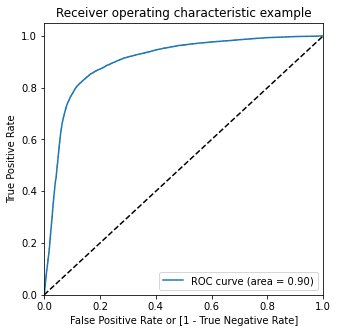

In [87]:
# Plotting the curve for the obtained metrics
draw_roc(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_prob)

#### Finding Optimal Cutoff Point

In [88]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_sm_pred_final[i]= y_train_sm_pred_final.Churn_prob.map(lambda x: 1 if x > i else 0)
y_train_sm_pred_final.head()

,Churn,Churn_prob,Churn_pred,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.777027,1,1,1,1,1,1,1,1,1,0,0
1,0,0.762382,1,1,1,1,1,1,1,1,1,0,0
2,0,0.015771,0,1,0,0,0,0,0,0,0,0,0
3,0,0.000295,0,1,0,0,0,0,0,0,0,0,0
4,0,0.000107,0,1,0,0,0,0,0,0,0,0,0


In [89]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['probability','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_sm_pred_final.Churn, y_train_sm_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
print(cutoff_df)

     probability  accuracy  sensitivity  specificity
0.0          0.0  0.500000     1.000000     0.000000
0.1          0.1  0.696567     0.974762     0.418371
0.2          0.2  0.756691     0.954729     0.558652
0.3          0.3  0.795179     0.929176     0.661181
0.4          0.4  0.822467     0.901835     0.743099
0.5          0.5  0.839161     0.866554     0.811767
0.6          0.6  0.844340     0.820653     0.868027
0.7          0.7  0.831353     0.751301     0.911404
0.8          0.8  0.762422     0.579158     0.945686
0.9          0.9  0.592276     0.205163     0.979389


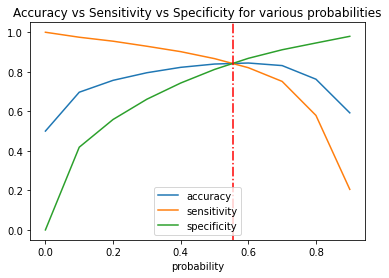

In [90]:
# plotting accuracy sensitivity and specificity for various probabilities calculated above.
cutoff_df.plot.line(x='probability', y=['accuracy','sensitivity','specificity'])
plt.axvline(0.555,linestyle='-.',color='r')
plt.title('Accuracy vs Sensitivity vs Specificity for various probabilities')
plt.show()

Initially we selected the optimm point of classification as 0.5.

From the curve above, 0.56 is the optimum point to take it as a cutoff probability.

In [91]:
# Let's create columns with refined probability cutoffs 
numbers = [0.50,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59]
for i in numbers:
    y_train_sm_pred_final[i]= y_train_sm_pred_final.Churn_prob.map(lambda x: 1 if x > i else 0)
y_train_sm_pred_final.head()

,Churn,Churn_prob,Churn_pred,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59
0,0,0.777027,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1
1,0,0.762382,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1
2,0,0.015771,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0.000295,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0.000107,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [92]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['probability','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.50,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_sm_pred_final.Churn, y_train_sm_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
print(cutoff_df)

      probability  accuracy  sensitivity  specificity
0.50         0.50  0.839161     0.866554     0.811767
0.51         0.51  0.840554     0.862190     0.818918
0.52         0.52  0.841685     0.858037     0.825333
0.53         0.53  0.843209     0.854041     0.832378
0.54         0.54  0.843577     0.848835     0.838320
0.55         0.55  0.843867     0.843893     0.843840
0.56         0.56  0.844130     0.838372     0.849887
0.57         0.57  0.844156     0.834481     0.853830
0.58         0.58  0.844235     0.830275     0.858194
0.59         0.59  0.844287     0.825595     0.862979


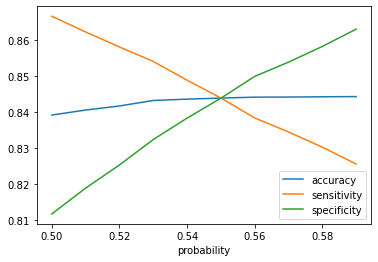

In [93]:
# plotting accuracy sensitivity and specificity for various probabilities calculated above.
cutoff_df.plot.line(x='probability', y=['accuracy','sensitivity','specificity'])
plt.show()

From the curve above, 0.55 is the optimum point to take it as a cutoff probability.

In [94]:
# From the curve above, 0.55 is the optimum point to take it as a cutoff probability.

y_train_sm_pred_final['final_churn_pred'] = y_train_sm_pred_final.Churn_prob.map( lambda x: 1 if x > 0.55 else 0)

y_train_sm_pred_final.head()

,Churn,Churn_prob,Churn_pred,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59,final_churn_pred
0,0,0.777027,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1
1,0,0.762382,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1
2,0,0.015771,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0.000295,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0.000107,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [95]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_pred))

0.8391608391608392


In [96]:
confusion2 = metrics.confusion_matrix(y_train_sm_pred_final.Churn, y_train_sm_pred_final.final_churn_pred )
print(confusion2)

[[16049  2970]
 [ 2969 16050]]


In [97]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives


print("Statistics for model at cutoff value for Converted_prob > 0.55")
print("")
# Let's check the overall accuracy.
print('Overall_Accuracy :{0}'.format(round(metrics.accuracy_score(y_train_sm_pred_final.Churn,
                                                                   y_train_sm_pred_final.final_churn_pred),2)))

sensitivity = round(TP / float(TP+FN),2)
# Let's see the sensitivity of our logistic regression model
print('Sensitivity :{0}'.format(sensitivity))

specificity = round(TN / float(TN+FP),2)

# Let us calculate specificity
print('Specificity : {0}'.format(specificity))

# Calculate false postive rate - predicting lead when customer does not convert
print('False positive rate : {0}'.format(round(FP/ float(TN+FP),2)))

precision = round(TP / float(TP+FP),2)
# positive predictive value (Precision)
print ('Precision(Positive predictive Value) : {0}'.format(precision))

# Negative predictive value
print ('Negative predictive Value : {0}'.format(round(TN / float(TN+ FN),2)))

print("")

print("Sensitivity - Specificity : {0} , {1}".format(sensitivity,specificity))

print("Precision - Recall : {0} , {1}".format(precision,sensitivity))

print("F1 score is : {0} ".format(2*(precision*sensitivity)/(precision+sensitivity)))

Statistics for model at cutoff value for Converted_prob > 0.55

Overall_Accuracy :0.84
Sensitivity :0.84
Specificity : 0.84
False positive rate : 0.16
Precision(Positive predictive Value) : 0.84
Negative predictive Value : 0.84

Sensitivity - Specificity : 0.84 , 0.84
Precision - Recall : 0.84 , 0.84
F1 score is : 0.8399999999999999 


#### Precision and recall tradeoff¶

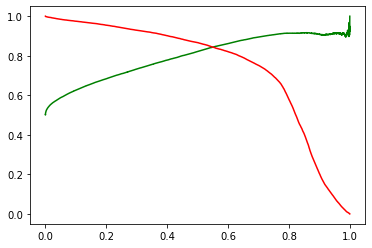

In [98]:
# import required libraries
from sklearn.metrics import precision_recall_curve

p, r, thresholds = precision_recall_curve(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_prob)

# Plotting the curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

## Making predictions on the test set
### Feature Scaling

In [99]:
# Scaling the test data
X_test[nums_col] = scaler.transform(X_test[nums_col])
X_test.head()

,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_7,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,tenure_range_6-12 Months,tenure_range_1-2 Yrs,tenure_range_2-5 Yrs,tenure_range_5 Yrs and above
76956,0.052841,0.040206,0.028321,0.004116,0.050557,0.039661,0.006867,0.0,0.000000,0.0,0.0,0.000000,0.0,0.046116,0.031219,0.004116,0.087009,0.083515,0.018697,0.004341,0.002656,0.003134,0.000000,0.000000,0.00000,0.066731,0.080062,0.012676,0.000560,0.000037,0.001591,0.000000,0.000000,0.000671,0.000000,0.000036,0.0,0.003382,0.000000,0.000000,0.000000,0.0,0.0,0.067395,0.054065,0.010002,0.024524,0.047204,0.019401,0.066774,0.068143,0.029395,0.001837,0.000403,0.000376,0.092761,0.000000,0.000000,0.000000,0.001158,0.000000,0.000000,0.000711,0.000000,0.000000,0.001159,0.000000,0.000000,0.056380,0.0,0.0,0.000083,0.000000,0.000000,0.020154,0.000401,0.004488,0.022801,0.043478,0.005102,0.030437,0.028879,0.036545,0.038710,0.022477,0.036545,0.000000,0.022477,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000,0.000000,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0,1,0,0
65114,0.057307,0.099399,0.082252,0.066074,0.027111,0.019890,0.016077,0.0,0.000000,0.0,0.0,0.000000,0.0,0.114011,0.090078,0.066057,0.039666,0.036220,0.042787,0.070938,0.015209,0.005913,0.000000,0.004581,0.01856,0.089759,0.110467,0.084064,0.000476,0.000099,0.001034,0.000000,0.011665,0.000547,0.001414,0.000543,0.0,0.000000,0.002062,0.004695,0.000199,0.0,0.0,0.089942,0.076187,0.067271,0.082392,0.093622,0.102018,0.029449,0.024675,0.051186,0.011312,0.010181,0.009710,0.105821,0.000000,0.000984,0.000000,0.001518,0.000893,0.000381,0.003227,0.004128,0.006051,0.002086,0.002003,0.001778,0.059347,0.0,0.0,0.000000,0.000000,0.000000,0.004382,0.000789,0.012820,0.026059,0.050725,0.020408,0.028139,0.044963,0.083721,0.081290,0.056192,0.000000,0.000000,0.056192,0.003351,0.010862,0.00000,0.032257,0.040999,0.000000,0.0,0.0,0.0,0.000000,0.000,0.000000,0.090909,0.071429,0.0000,0.0,0.0,0.0,0.064645,0.098846,0.090037,0.000000,0,0,1,0
4997,0.062988,0.012443,0.007040,0.010664,0.191906,0.151992,0.017877,0.0,0.015795,0.0,0.0,0.070493,0.0,0.004511,0.002863,0.009629,0.016874,0.022216,0.015206,0.025429,0.005473,0.008713,0.000000,0.000000,0.00000,0.011386,0.016709,0.016947,0.181919,0.011730,0.000000,0.000000,0.000193,0.186813,0.115625,0.012508,0.0,0.000000,0.000000,0.002236,0.000000,0.0,0.0,0.158946,0.122549,0.025997,0.001746,0.001384,0.003603,0.005185,0.008153,0.012584,0.000817,0.001644,0.004080,0.00

In [100]:
# Feature selection
X_test = X_test[col]
X_test.head()

,roam_og_mou_8,std_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,spl_ic_mou_8,total_rech_num_8,total_rech_amt_6,last_day_rch_amt_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sep_vbc_3g
76956,0.0,0.000000,0.010002,0.019401,0.029395,0.000376,0.0,0.005102,0.030437,0.022477,0.0,0.000000,0.0000,0.000000
65114,0.0,0.001414,0.067271,0.102018,0.051186,0.009710,0.0,0.020408,0.028139,0.056192,0.0,0.000000,0.0000,0.000000
4997,0.0,0.115625,0.025997,0.003603,0.012584,0.004080,0.0,0.081633,0.054092,0.011238,0.0,0.117647,0.0000,0.000000
7790,0.0,0.001585,0.029689,0.012704,0.047001,0.000000,0.0,0.010204,0.028027,0.056192,0.0,0.000000,0.0000,0.000000
82656,0.0,0.003674,0.032802,0.017130,0.066392,0.024580,0.0,0.020408,0.015639,0.056192,0.0,0.000000,0.0625,0.612471


In [101]:
# Adding constant to the test model.
X_test_SM = sm.add_constant(X_test)

In [102]:
y_test_pred = res.predict(X_test_SM)
y_test_pred[:10]

76956    5.388848e-01
65114    1.060130e-02
4997     6.106521e-01
7790     2.029877e-01
82656    2.066090e-08
10351    2.697360e-01
61578    1.096012e-01
15145    1.782062e-01
86070    4.706971e-01
49220    4.973385e-02
dtype: float64

In [103]:
# Converting y_pred to a dataframe which is an array
y_pred = pd.DataFrame(y_test_pred)
y_pred.head()

,0
76956,5.388848e-01
65114,1.060130e-02
4997,6.106521e-01
7790,2.029877e-01
82656,2.066090e-08


In [104]:
# Renaming the column 
y_pred=y_pred.rename(columns = {0:"Churn_prob"})

In [105]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,churn
76956,0
65114,0
4997,0
7790,0
82656,0


In [106]:
# Appending y_test_df and y_pred
y_pred_final = pd.concat([y_test_df,y_pred],axis=1)
y_pred_final.head()

,churn,Churn_prob
76956,0,5.388848e-01
65114,0,1.060130e-02
4997,0,6.106521e-01
7790,0,2.029877e-01
82656,0,2.066090e-08


In [107]:
# The optimum point to take it as a cutoff probability is 0.55
y_pred_final['test_churn_pred'] = y_pred_final.Churn_prob.map(lambda x: 1 if x>0.55 else 0)
y_pred_final.head()

,churn,Churn_prob,test_churn_pred
76956,0,5.388848e-01,0
65114,0,1.060130e-02,0
4997,0,6.106521e-01,1
7790,0,2.029877e-01,0
82656,0,2.066090e-08,0


In [108]:
# checking if 80% cases are correctly predicted based on the converted column.

# get the total of final predicted conversion or non conversion counts from the actual converted rates

checking_test_df = y_pred_final.loc[y_pred_final['churn']==1,['churn','test_churn_pred']]
checking_test_df['test_churn_pred'].value_counts()

1    583
0    140
Name: test_churn_pred, dtype: int64

In [109]:
# check the percentage of final_predicted conversions on test data

583/float(583+140)

0.8063623789764869

### Overall Metrics - Accuracy, Confusion Metrics, Sensitivity, Specificity on test set

In [110]:
# Checking the overall accuracy of the predicted set.
metrics.accuracy_score(y_pred_final.churn, y_pred_final.test_churn_pred)

0.8410342889263631

In [111]:
# Confusion Matrix
confusion2_test = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.test_churn_pred)
print("Confusion Matrix\n",confusion2_test)

Confusion Matrix
 [[6898 1274]
 [ 140  583]]


In [112]:
# Calculating model validation parameters
TP = confusion2_test[1,1] # true positive 
TN = confusion2_test[0,0] # true negatives
FP = confusion2_test[0,1] # false positives
FN = confusion2_test[1,0] # false negatives

metric = []
print("Statistics for model at cutoff value for Converted_prob > 0.55")
print("")
# Let's check the overall accuracy.
Accuracy = (round(metrics.accuracy_score(y_pred_final.churn, y_pred_final.test_churn_pred),2))
metric.append(Accuracy)
print('Overall_Accuracy :{0}'.format(round(metrics.accuracy_score(y_pred_final.churn, y_pred_final.test_churn_pred),2)))
sensitivity = round(TP / float(TP+FN),2)
metric.append(sensitivity)
# Let's see the sensitivity of our logistic regression model
print('Sensitivity :{0}'.format(sensitivity))

specificity = round(TN / float(TN+FP),2)
metric.append(specificity)
# Let us calculate specificity
print('Specificity : {0}'.format(specificity))

# Calculate false postive rate - predicting lead when customer does not convert
print('False positive rate : {0}'.format(round(FP/ float(TN+FP),2)))

precision = round(TP / float(TP+FP),2)
metric.append(precision)
# positive predictive value (Precision)
print ('Precision(Positive predictive Value) : {0}'.format(precision))

# Negative predictive value
print ('Negative predictive Value : {0}'.format(round(TN / float(TN+ FN),2)))

print("")

print("Sensitivity - Specificity : {0} , {1}".format(sensitivity,specificity))

print("Precision - Recall : {0} , {1}".format(precision,sensitivity))
F1 = (2*(precision*sensitivity)/(precision+sensitivity))
metric.append(F1)
print("F1 score is : {0} ".format(2*(precision*sensitivity)/(precision+sensitivity)))

Statistics for model at cutoff value for Converted_prob > 0.55

Overall_Accuracy :0.84
Sensitivity :0.81
Specificity : 0.84
False positive rate : 0.16
Precision(Positive predictive Value) : 0.31
Negative predictive Value : 0.98

Sensitivity - Specificity : 0.81 , 0.84
Precision - Recall : 0.31 , 0.81
F1 score is : 0.4483928571428571 


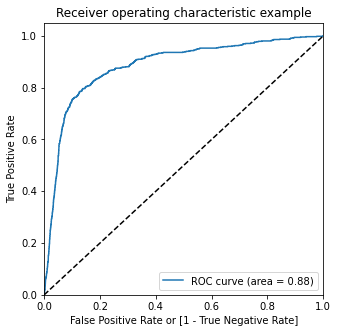

In [113]:
# ROC curve for the test dataset

# Defining the variables to plot the curve
fpr, tpr, thresholds = metrics.roc_curve(y_pred_final.churn,y_pred_final.Churn_prob, drop_intermediate = False )
# Plotting the curve for the obtained metrics
draw_roc(y_pred_final.churn,y_pred_final.Churn_prob)

The AUC score for train dataset is 0.90 and the test dataset is 0.88.
This model can be considered as a good model.



#### The results

In [114]:
print("The accuracy of the predicted model is: ",round(metrics.accuracy_score(y_pred_final.churn, y_pred_final.test_churn_pred),2)*100,"%")
print("The sensitivity of the predicted model is: ",round(TP / float(TP+FN),2)*100,"%")

The accuracy of the predicted model is:  84.0 %
The sensitivity of the predicted model is:  81.0 %


As the model created is based on a sentivity model, i.e. the True positive rate is given more importance as the actual and prediction of churn by a customer


# Modelling with PCA

### Logistic Regression using PCA

In [115]:
# split the dateset into train and test datasets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, train_size=0.7, random_state=1)
print("Dimension of X_train:", X_train.shape)
print("Dimension of X_test:", X_test.shape)

# apply scaling on the dataset

scaler = MinMaxScaler()
X_train[nums_col] = scaler.fit_transform(X_train[nums_col])
X_test[nums_col] = scaler.transform(X_test[nums_col])

Dimension of X_train: (20752, 114)
Dimension of X_test: (8895, 114)


In [116]:
from sklearn.decomposition import PCA

pca = PCA(random_state=42)

# applying PCA on train data

pca.fit(X_train)

# split the dateset into train and test datasets with pca
X_train_pca=pca.fit_transform(X_train)
print("Dimension of X_train_sm_pca: ",X_train_pca.shape)

print(pca.components_)


print("explained_variance_ratio for 10 comp : ",sum(pca.explained_variance_ratio_[:11]))

Dimension of X_train_sm_pca:  (20752, 114)
[[-3.88690598e-04  4.71542755e-04  1.79666604e-03 ...  6.03908077e-01
  -7.90118713e-01  1.18976378e-03]
 [-1.04024366e-05 -4.54980757e-03 -5.69965581e-03 ... -5.91097178e-01
  -3.58335136e-01  3.25111009e-03]
 [-1.56654725e-03  3.20618831e-02  3.17726483e-02 ...  5.12453082e-01
   4.84457456e-01 -2.45708283e-02]
 ...
 [ 9.71494808e-07 -8.58073363e-06  1.09058839e-06 ...  3.30172296e-09
   7.04710853e-09 -3.19041773e-08]
 [-6.06784591e-07 -3.14154944e-06  3.13869598e-07 ...  2.95812349e-08
  -3.36273515e-09 -1.66659266e-08]
 [ 1.37214413e-06  1.68634582e-06 -1.91889832e-06 ...  9.79817853e-09
   1.08449470e-10  6.51120124e-08]]
explained_variance_ratio for 10 comp :  0.8976572803711406


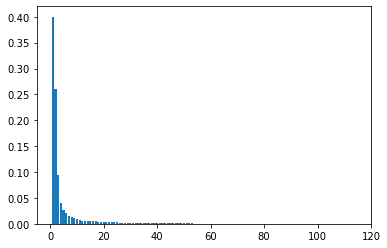

In [117]:
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
var_cumu = np.cumsum(pca.explained_variance_ratio_)

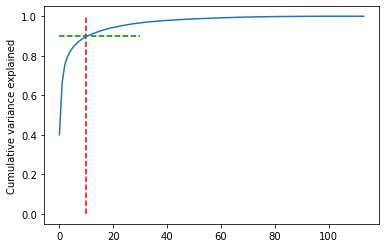

In [118]:
plt.vlines(x=10, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.9, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

In [119]:
X_test_pca=pca.transform(X_test)
print("Dimension of X_train_sm_pca: ",X_test_pca.shape)

print(pca.components_)


print("explained_variance_ratio for 10 comp : ",sum(pca.explained_variance_ratio_[:11]))

Dimension of X_train_sm_pca:  (8895, 114)
[[-3.88690598e-04  4.71542755e-04  1.79666604e-03 ...  6.03908077e-01
  -7.90118713e-01  1.18976378e-03]
 [-1.04024366e-05 -4.54980757e-03 -5.69965581e-03 ... -5.91097178e-01
  -3.58335136e-01  3.25111009e-03]
 [-1.56654725e-03  3.20618831e-02  3.17726483e-02 ...  5.12453082e-01
   4.84457456e-01 -2.45708283e-02]
 ...
 [ 9.71494808e-07 -8.58073363e-06  1.09058839e-06 ...  3.30172296e-09
   7.04710853e-09 -3.19041773e-08]
 [-6.06784591e-07 -3.14154944e-06  3.13869598e-07 ...  2.95812349e-08
  -3.36273515e-09 -1.66659266e-08]
 [ 1.37214413e-06  1.68634582e-06 -1.91889832e-06 ...  9.79817853e-09
   1.08449470e-10  6.51120124e-08]]
explained_variance_ratio for 10 comp :  0.8976572803711406


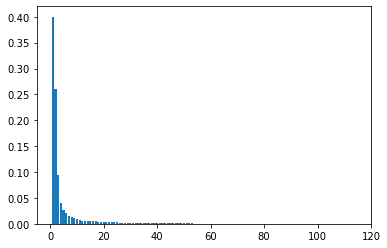

In [120]:
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
var_cumu = np.cumsum(pca.explained_variance_ratio_)

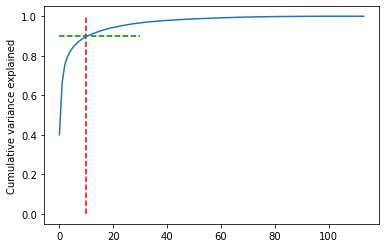

In [121]:
plt.vlines(x=10, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.9, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

- here we can conclude 90% variation exlplained by first 10 components so taking in prior.

In [122]:
pc2 = PCA(n_components=10, random_state=42)
X_train_pca = pc2.fit_transform(X_train)
X_test_pca = pc2.transform(X_test)

In [123]:
cols=["PC"+str(i) for i in range(1,11)]
X_train_pca = pd.DataFrame(X_train_pca, columns=cols)
X_test_pca = pd.DataFrame(X_test_pca, columns=cols)

In [124]:
sm = SMOTE(random_state=42)
X_train_sm,y_train_sm = sm.fit_resample(X_train_pca,y_train)
print("Dimension of X_train_sm Shape:", X_train_sm.shape)
print("Dimension of y_train_sm Shape:", y_train_sm.shape)

Dimension of X_train_sm Shape: (37940, 10)
Dimension of y_train_sm Shape: (37940,)


## 1.Logistic Regression With PCA

In [125]:
# Importing necessary libraries for Model creation
import statsmodels.api as sm
X_train_sm = sm.add_constant(X_train_sm)
# Logistic regression model
logm = sm.GLM(y_train_sm,X_train_sm, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37940
Model:                            GLM   Df Residuals:                    37929
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -21148.
Date:                Mon, 31 May 2021   Deviance:                       42296.
Time:                        22:31:46   Pearson chi2:                 4.75e+04
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.6013      0.014    -41.580      0.000      -0.630      -0.573
PC1            0.1977      0.022      9.166      0.000       0.155       0.240
PC2            0.0957      0.026      3.745      0.000       0.046       0.146
PC3            1.8519      0.050     36.808      0.000       1.753       1.951
PC4           -0.9939      0.082    -12.162      0.000      -1.154      -0.834
PC5           -6.8490      0.130    -52.738      0.000      -7.104      -6.594
PC6           -1.6720      0.137    -12.165      0.000      -1.941      -1.403
PC7           -1.7892      0.135    -13.291      0.000      -2.053      -1.525
PC8           -2.0591      0.150    -13.693      0.000      -2.354      -1.764
PC9           -7.9643      0.174    -45.678      0.000      -8.306      -7.623
PC10          -4.1173      0.189    -21.756      0.000      -4.488      -3.746
==============================================================================
"""

In [126]:
# checking VIF's
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = X_train_sm.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,1.16
10,PC10,1.10
9,PC9,1.09
4,PC4,1.06
7,PC7,1.05
3,PC3,1.03
5,PC5,1.02
6,PC6,1.02
2,PC2,1.01
8,PC8,1.01


In [127]:
# Checking the predicted values on the train set
y_train_sm_pred = res.predict(X_train_sm)
y_train_sm_pred[:12]

0     0.672737
1     0.324515
2     0.971418
3     0.096815
4     0.448413
5     0.453947
6     0.024677
7     0.555431
8     0.476176
9     0.604169
10    0.255621
11    0.526179
dtype: float64

In [128]:
# Reshape of predicted values
y_train_sm_pred = y_train_sm_pred.values.reshape(-1)
len(y_train_sm_pred)

37940

In [129]:
y_train_sm_pred_final = pd.DataFrame({'Churn':y_train_sm.values, 'Churn_prob':y_train_sm_pred})
y_train_sm_pred_final.head()

,Churn,Churn_prob
0,0,0.672737
1,0,0.324515
2,0,0.971418
3,0,0.096815
4,0,0.448413


#### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [130]:
y_train_sm_pred_final['Churn_pred'] = y_train_sm_pred_final.Churn_prob.map(lambda x: 1 if x > 0.5 else 0)

# Viewing the prediction results
y_train_sm_pred_final.head()

,Churn,Churn_prob,Churn_pred
0,0,0.672737,1
1,0,0.324515,0
2,0,0.971418,1
3,0,0.096815,0
4,0,0.448413,0


In [131]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_pred )
print(confusion)

[[13312  5658]
 [ 4907 14063]]


In [132]:
# Predicted      not_churn    churn
# Actual
# not_churn        13312      5658
# churn            4907      14063

In [133]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_pred))

0.7215340010542962


In [134]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives
print("Statistics for model at cutoff value for Converted_prob > 0.5")
print("")
# Let's check the overall accuracy.
print('Overall_Accuracy :{0}'.format(round(metrics.accuracy_score(y_train_sm_pred_final.Churn,
                                                                   y_train_sm_pred_final.Churn_pred),2)))

sensitivity = round(TP / float(TP+FN),2)
# Let's see the sensitivity of our logistic regression model
print('Sensitivity :{0}'.format(sensitivity))

specificity = round(TN / float(TN+FP),2)

# Let us calculate specificity
print('Specificity : {0}'.format(specificity))

# Calculate false postive rate - predicting lead when customer does not convert
print('False positive rate : {0}'.format(round(FP/ float(TN+FP),2)))

precision = round(TP / float(TP+FP),2)
# positive predictive value (Precision)
print ('Precision(Positive predictive Value) : {0}'.format(precision))

# Negative predictive value
print ('Negative predictive Value : {0}'.format(round(TN / float(TN+ FN),2)))

print("")

print("Sensitivity - Specificity : {0} , {1}".format(sensitivity,specificity))

print("Precision - Recall : {0} , {1}".format(precision,sensitivity))

print("F1 score is : {0} ".format(2*(precision*sensitivity)/(precision+sensitivity)))

Statistics for model at cutoff value for Converted_prob > 0.5

Overall_Accuracy :0.72
Sensitivity :0.74
Specificity : 0.7
False positive rate : 0.3
Precision(Positive predictive Value) : 0.71
Negative predictive Value : 0.73

Sensitivity - Specificity : 0.74 , 0.7
Precision - Recall : 0.71 , 0.74
F1 score is : 0.7246896551724138 


#### Plotting the ROC Curve

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [135]:
# Defining the variables to plot the curve
fpr, tpr, thresholds = metrics.roc_curve( y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_prob, 
                                         drop_intermediate = False )

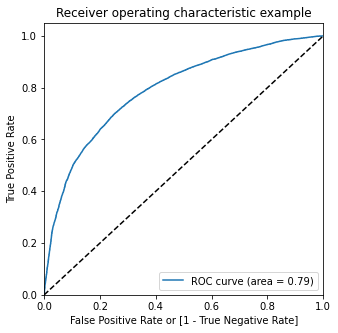

In [136]:
# Plotting the curve for the obtained metrics
draw_roc(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_prob)

#### Finding Optimal Cutoff Point

In [137]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_sm_pred_final[i]= y_train_sm_pred_final.Churn_prob.map(lambda x: 1 if x > i else 0)
y_train_sm_pred_final.head()

,Churn,Churn_prob,Churn_pred,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.672737,1,1,1,1,1,1,1,1,0,0,0
1,0,0.324515,0,1,1,1,1,0,0,0,0,0,0
2,0,0.971418,1,1,1,1,1,1,1,1,1,1,1
3,0,0.096815,0,1,0,0,0,0,0,0,0,0,0
4,0,0.448413,0,1,1,1,1,1,0,0,0,0,0


In [138]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['probability','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_sm_pred_final.Churn, y_train_sm_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
print(cutoff_df)

     probability  accuracy  sensitivity  specificity
0.0          0.0  0.500000     1.000000     0.000000
0.1          0.1  0.550923     0.986400     0.115445
0.2          0.2  0.598471     0.954507     0.242435
0.3          0.3  0.650395     0.910385     0.390406
0.4          0.4  0.695493     0.843911     0.547074
0.5          0.5  0.721534     0.741328     0.701740
0.6          0.6  0.713337     0.593727     0.832947
0.7          0.7  0.668925     0.409858     0.927992
0.8          0.8  0.597285     0.220137     0.974433
0.9          0.9  0.530733     0.068371     0.993094


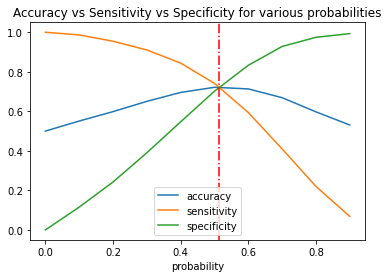

In [139]:
# plotting accuracy sensitivity and specificity for various probabilities calculated above.
cutoff_df.plot.line(x='probability', y=['accuracy','sensitivity','specificity'])
plt.axvline(0.514,linestyle='-.',color='r')
plt.title('Accuracy vs Sensitivity vs Specificity for various probabilities')
plt.show()

Initially we selected the optimm point of classification as 0.5.

From the curve above, 0.51 is the optimum point to take it as a cutoff probability.

In [140]:
# Let's create columns with refined probability cutoffs 
numbers = [0.50,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59]
for i in numbers:
    y_train_sm_pred_final[i]= y_train_sm_pred_final.Churn_prob.map(lambda x: 1 if x > i else 0)
y_train_sm_pred_final.head()

,Churn,Churn_prob,Churn_pred,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59
0,0,0.672737,1,1,1,1,1,1,1,1,0,0,0,1,1,1,1,1,1,1,1,1
1,0,0.324515,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0.971418,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0.096815,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0.448413,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [141]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['probability','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.50,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_sm_pred_final.Churn, y_train_sm_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
print(cutoff_df)

      probability  accuracy  sensitivity  specificity
0.50         0.50  0.721534     0.741328     0.701740
0.51         0.51  0.722114     0.727833     0.716394
0.52         0.52  0.722746     0.716131     0.729362
0.53         0.53  0.723695     0.703005     0.744386
0.54         0.54  0.722957     0.687507     0.758408
0.55         0.55  0.721376     0.671534     0.771218
0.56         0.56  0.719873     0.656194     0.783553
0.57         0.57  0.719610     0.642857     0.796363
0.58         0.58  0.716948     0.626041     0.807855
0.59         0.59  0.715208     0.610279     0.820137


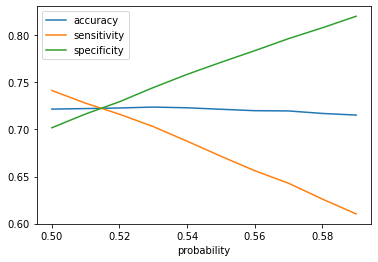

In [142]:
# plotting accuracy sensitivity and specificity for various probabilities calculated above.
cutoff_df.plot.line(x='probability', y=['accuracy','sensitivity','specificity'])
plt.show()

From the curve above, 0.51 is the optimum point to take it as a cutoff probability.

In [143]:
# From the curve above, 0.51 is the optimum point to take it as a cutoff probability.

y_train_sm_pred_final['final_churn_pred'] = y_train_sm_pred_final.Churn_prob.map( lambda x: 1 if x > 0.514 else 0)

y_train_sm_pred_final.head()

,Churn,Churn_prob,Churn_pred,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59,final_churn_pred
0,0,0.672737,1,1,1,1,1,1,1,1,0,0,0,1,1,1,1,1,1,1,1,1,1
1,0,0.324515,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0.971418,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0.096815,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0.448413,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [144]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_pred))

0.7215340010542962


In [145]:
confusion2 = metrics.confusion_matrix(y_train_sm_pred_final.Churn, y_train_sm_pred_final.final_churn_pred )
print(confusion2)

[[13700  5270]
 [ 5252 13718]]


In [147]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives


print("Statistics for model at cutoff value for Converted_prob > 0.51")
print("")
# Let's check the overall accuracy.
print('Overall_Accuracy :{0}'.format(round(metrics.accuracy_score(y_train_sm_pred_final.Churn,
                                                                   y_train_sm_pred_final.final_churn_pred),2)))

sensitivity = round(TP / float(TP+FN),2)

# Let's see the sensitivity of our logistic regression model
print('Sensitivity :{0}'.format(sensitivity))

specificity = round(TN / float(TN+FP),2)

# Let us calculate specificity
print('Specificity : {0}'.format(specificity))

# Calculate false postive rate - predicting lead when customer does not convert
print('False positive rate : {0}'.format(round(FP/ float(TN+FP),2)))

precision = round(TP / float(TP+FP),2)
# positive predictive value (Precision)
print ('Precision(Positive predictive Value) : {0}'.format(precision))

# Negative predictive value
print ('Negative predictive Value : {0}'.format(round(TN / float(TN+ FN),2)))

print("")

print("Sensitivity - Specificity : {0} , {1}".format(sensitivity,specificity))

print("Precision - Recall : {0} , {1}".format(precision,sensitivity))

print("F1 score is : {0} ".format(2*(precision*sensitivity)/(precision+sensitivity)))

Statistics for model at cutoff value for Converted_prob > 0.51

Overall_Accuracy :0.72
Sensitivity :0.72
Specificity : 0.72
False positive rate : 0.28
Precision(Positive predictive Value) : 0.72
Negative predictive Value : 0.72

Sensitivity - Specificity : 0.72 , 0.72
Precision - Recall : 0.72 , 0.72
F1 score is : 0.72 


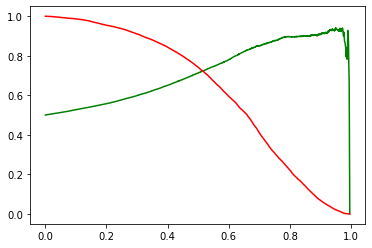

In [148]:
# import required libraries
from sklearn.metrics import precision_recall_curve

p, r, thresholds = precision_recall_curve(y_train_sm_pred_final.Churn, y_train_sm_pred_final.Churn_prob)

# Plotting the curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

### Making predictions on the test set


In [149]:
# Feature selection
X_test_SM = X_test_pca
# Adding constant to the test model.
X_test_SM = sm.add_constant(X_test_SM)

X_test_SM.head()

,const,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,1.0,0.689968,-0.439963,0.120769,-0.162217,0.002133,-0.096298,0.030047,0.086591,0.024754,-0.072021
1,1.0,0.692622,-0.443596,0.158607,0.036788,-0.109162,0.011993,0.014243,-0.124565,-0.057994,0.019753
2,1.0,-0.705436,-0.205688,0.075549,-0.062351,0.079687,-0.081500,-0.079017,-0.006305,0.064330,0.096160
3,1.0,0.191743,0.870510,0.303715,-0.057845,-0.025002,0.175951,0.021844,0.089301,0.041159,-0.069117
4,1.0,-0.703354,-0.208337,0.106156,-0.074467,-0.107999,-0.030306,0.020923,-0.083754,-0.060155,0.019843


In [150]:
y_test_pred = res.predict(X_test_SM)
y_test_pred[:10]

0    0.472925
1    0.748285
2    0.151613
3    0.437984
4    0.697003
5    0.409898
6    0.469622
7    0.947359
8    0.804092
9    0.034134
dtype: float64

In [151]:
# Converting y_pred to a dataframe which is an array
y_pred = pd.DataFrame(y_test_pred)
y_pred.head()

,0
0,0.472925
1,0.748285
2,0.151613
3,0.437984
4,0.697003


In [152]:
# Renaming the column 
y_pred=y_pred.rename(columns = {0:"Churn_prob"})

In [153]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test.reset_index(drop=True))
y_test_df.head()

,churn
0,0
1,0
2,0
3,0
4,0


In [154]:
# Appending y_test_df and y_pred
y_pred_final = pd.concat([y_test_df,y_pred],axis=1)
y_pred_final.head()

,churn,Churn_prob
0,0,0.472925
1,0,0.748285
2,0,0.151613
3,0,0.437984
4,0,0.697003


In [155]:
# The optimum point to take it as a cutoff probability is 0.55
y_pred_final['test_churn_pred'] = y_pred_final.Churn_prob.map(lambda x: 1 if x>0.514 else 0)
y_pred_final.head()

,churn,Churn_prob,test_churn_pred
0,0,0.472925,0
1,0,0.748285,1
2,0,0.151613,0
3,0,0.437984,0
4,0,0.697003,1


In [156]:
# checking if 80% cases are correctly predicted based on the converted column.

# get the total of final predicted conversion or non conversion counts from the actual converted rates

checking_test_df = y_pred_final.loc[y_pred_final['churn']==1,['churn','test_churn_pred']]
checking_test_df['test_churn_pred'].value_counts()

1    463
0    211
Name: test_churn_pred, dtype: int64

In [157]:
# check the percentage of final_predicted conversions on test data

463/float(463+211)

0.6869436201780416

### Overall Metrics - Accuracy, Confusion Metrics, Sensitivity, Specificity on test set

In [158]:
# Confusion Matrix
confusion2_test = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.test_churn_pred)
print("Confusion Matrix\n",confusion2_test)

Confusion Matrix
 [[5850 2371]
 [ 211  463]]


In [159]:
# Calculating model validation parameters
TP = confusion2_test[1,1] # true positive 
TN = confusion2_test[0,0] # true negatives
FP = confusion2_test[0,1] # false positives
FN = confusion2_test[1,0] # false negatives

metric2 = []
Accuracy = (round(metrics.accuracy_score(y_pred_final.churn, y_pred_final.test_churn_pred),2))
metric2.append(Accuracy)
print("Statistics for model at cutoff value for Converted_prob > 0.55")
print("")
# Let's check the overall accuracy.
print('Overall_Accuracy :{0}'.format(round(metrics.accuracy_score(y_pred_final.churn, y_pred_final.test_churn_pred),2)))
sensitivity = round(TP / float(TP+FN),2)
metric2.append(sensitivity)
# Let's see the sensitivity of our logistic regression model
print('Sensitivity :{0}'.format(sensitivity))

specificity = round(TN / float(TN+FP),2)
metric2.append(specificity)

# Let us calculate specificity
print('Specificity : {0}'.format(specificity))

# Calculate false postive rate - predicting lead when customer does not convert
print('False positive rate : {0}'.format(round(FP/ float(TN+FP),2)))

precision = round(TP / float(TP+FP),2)
metric2.append(precision)
# positive predictive value (Precision)
print ('Precision(Positive predictive Value) : {0}'.format(precision))

# Negative predictive value
print ('Negative predictive Value : {0}'.format(round(TN / float(TN+ FN),2)))

print("")

print("Sensitivity - Specificity : {0} , {1}".format(sensitivity,specificity))

print("Precision - Recall : {0} , {1}".format(precision,sensitivity))

F1 = (2*(precision*sensitivity)/(precision+sensitivity))
metric2.append(precision)
print("F1 score is : {0} ".format(2*(precision*sensitivity)/(precision+sensitivity)))

Statistics for model at cutoff value for Converted_prob > 0.55

Overall_Accuracy :0.71
Sensitivity :0.69
Specificity : 0.71
False positive rate : 0.29
Precision(Positive predictive Value) : 0.16
Negative predictive Value : 0.97

Sensitivity - Specificity : 0.69 , 0.71
Precision - Recall : 0.16 , 0.69
F1 score is : 0.25976470588235295 


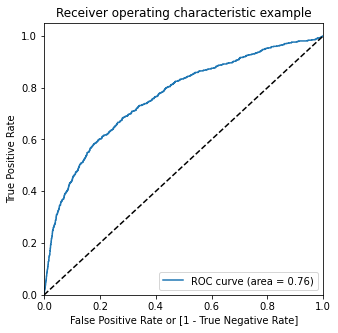

In [160]:
# ROC curve for the test dataset

# Defining the variables to plot the curve
fpr, tpr, thresholds = metrics.roc_curve(y_pred_final.churn,y_pred_final.Churn_prob, drop_intermediate = False )
# Plotting the curve for the obtained metrics
draw_roc(y_pred_final.churn,y_pred_final.Churn_prob)

In [161]:
print("The accuracy of the predicted model is: ",round(metrics.accuracy_score(y_pred_final.churn, y_pred_final.test_churn_pred),2)*100,"%")
print("The sensitivity of the predicted model is: ",round(TP / float(TP+FN),2)*100,"%")

The accuracy of the predicted model is:  71.0 %
The sensitivity of the predicted model is:  69.0 %


#### The accuracy of the predicted model of logistic regression without using PCA is:  84.0 %
#### The accuracy of the predicted model of logistic regression with using PCA is:  71.0 %

## 2 Decision trees with PCA

In [162]:
pc2 = PCA(n_components=10, random_state=42)
X_train_pca = pc2.fit_transform(X_train)
X_test_pca = pc2.transform(X_test)

In [163]:
cols=["PC"+str(i) for i in range(1,11)]
X_train_pca = pd.DataFrame(X_train_pca, columns=cols)

In [164]:
sm = SMOTE(random_state=42)
X_train_sm,y_train_sm = sm.fit_resample(X_train_pca,y_train)
print("Dimension of X_train_sm Shape:", X_train_sm.shape)
print("Dimension of y_train_sm Shape:", y_train_sm.shape)

Dimension of X_train_sm Shape: (37940, 10)
Dimension of y_train_sm Shape: (37940,)


Fitting the decision tree with default hyperparameters, apart from max_depth which is 3 so that we can plot and read the tree.

In [165]:
# Importing required libraries
from sklearn.tree import DecisionTreeClassifier

# Decision model
dt = DecisionTreeClassifier(max_depth=3, random_state=42)
dt.fit(X_train_sm, y_train_sm)

DecisionTreeClassifier(max_depth=3, random_state=42)

In [166]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus   #, graphviz
from sklearn import tree

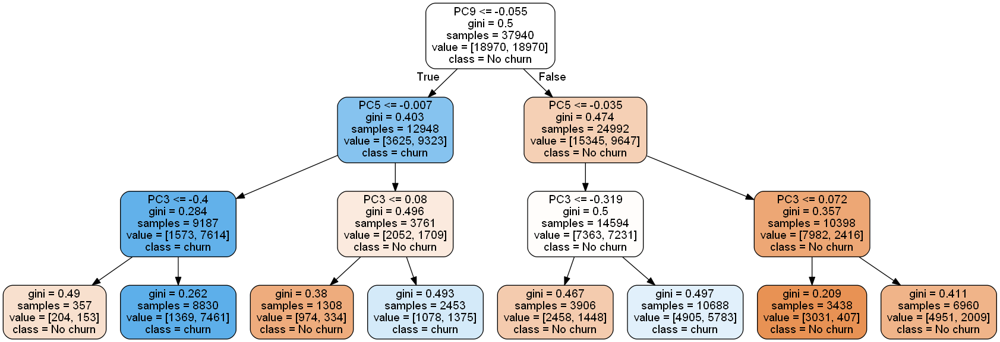

In [167]:
# plotting tree with max_depth=3
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=X_train_sm.columns, 
                class_names=['No churn', "churn"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())
#Image(graph.create_png(),width=800,height=900)
#graph.write_pdf("dt_heartdisease.pdf")

#### Evaluating model performance

In [168]:
# Predictions On train and test data
y_train_pred_dt = dt.predict(X_train_sm)
y_test_pred_dt = dt.predict(X_test_pca)

# Import required libraries
from sklearn.metrics import confusion_matrix, accuracy_score

# Accuracy score and confusion matrix on train data
print(accuracy_score(y_train_sm, y_train_pred_dt))
confusion_matrix(y_train_sm, y_train_pred_dt)

# Accuracy score and confusion matrix on testdata
print(accuracy_score(y_test, y_test_pred_dt))
confusion_matrix(y_test, y_test_pred_dt)

0.6915392725355824
0.6118043844856661


array([[4938, 3283],
       [ 170,  504]], dtype=int64)

#### Creating helper functions to evaluate model performance and help plot the decision tree

In [169]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X_train_sm.columns, 
                    class_names=['churn', "No churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [170]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train_sm, dt_classifier.predict(X_train_sm)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train_sm, dt_classifier.predict(X_train_sm)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test_pca)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test_pca)))

#### Without setting any hyper-parameters

In [171]:
# Decision forest without hyper-parameters
dt_default = DecisionTreeClassifier(random_state=42)
dt_default.fit(X_train_sm, y_train_sm)

DecisionTreeClassifier(random_state=42)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.164818 to fit



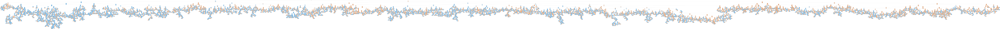

In [172]:
# visualization of decision tree
gph = get_dt_graph(dt_default)
Image(gph.create_png())

In [173]:
# Model predictions
evaluate_model(dt_default)

Train Accuracy : 1.0
Train Confusion Matrix:
[[18970     0]
 [    0 18970]]
--------------------------------------------------
Test Accuracy : 0.7889825744800449
Test Confusion Matrix:
[[6737 1484]
 [ 393  281]]


#### Hyper-Parameter Tuning

In [174]:
# Decision tree Hyper-Parameter tuning
dt = DecisionTreeClassifier(random_state=42)

In [175]:
# import required libarraies
from sklearn.model_selection import GridSearchCV

# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [176]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [177]:
%%time
grid_search.fit(X_train_sm, y_train_sm)

Fitting 4 folds for each of 50 candidates, totalling 200 fits
Wall time: 37.5 s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [178]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.185469,0.006234,0.003024,0.003011,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.647654,0.660411,0.645229,0.656616,0.652478,0.006242,41
1,0.169608,0.003866,0.006551,0.003875,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.647654,0.660411,0.645229,0.656616,0.652478,0.006242,41
2,0.178643,0.008344,0.007550,0.004359,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.647654,0.660411,0.645229,0.656616,0.652478,0.006242,41
3,0.183329,0.007913,0.008119,0.003521,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.647654,0.660411,0.645229,0.656616,0.652478,0.006242,41
4,0.171215,0.001427,0.004526,0.003586,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.647654,0.660411,0.645229,0.656616,0.652478,0.006242,41


In [179]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
45,1.438649,0.015232,0.007480,0.000499,entropy,20,5,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.812335,0.823300,0.816658,0.823089,0.818846,0.004610,1
20,0.851361,0.013527,0.003905,0.006764,gini,20,5,"{'criterion': 'gini', 'max_depth': 20, 'min_sa...",0.812862,0.802847,0.817712,0.812968,0.811597,0.005419,2
46,1.412718,0.016059,0.007481,0.000499,entropy,20,10,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.795888,0.812019,0.807696,0.806958,0.805640,0.005953,3
21,0.812308,0.019131,0.011716,0.006765,gini,20,10,"{'criterion': 'gini', 'max_depth': 20, 'min_sa...",0.798313,0.796521,0.800949,0.798946,0.798682,0.001582,4
47,1.300914,0.011589,0.003906,0.006765,entropy,20,20,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.780285,0.785556,0.787770,0.795150,0.787190,0.005340,5


In [180]:
grid_search.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=5,
                       random_state=42)

In [181]:
dt_best = grid_search.best_estimator_

In [182]:
# Making Predictions
evaluate_model(dt_best)

# Import required libraries
from sklearn.metrics import classification_report

print("   ")
print("Predictions of all parameters")
# Predictions of all parameters
print(classification_report(y_test, dt_best.predict(X_test_pca)))

Train Accuracy : 0.9329731154454401
Train Confusion Matrix:
[[17665  1305]
 [ 1238 17732]]
--------------------------------------------------
Test Accuracy : 0.782911748173131
Test Confusion Matrix:
[[6655 1566]
 [ 365  309]]
   
Predictions of all parameters
              precision    recall  f1-score   support

           0       0.95      0.81      0.87      8221
           1       0.16      0.46      0.24       674

    accuracy                           0.78      8895
   macro avg       0.56      0.63      0.56      8895
weighted avg       0.89      0.78      0.83      8895



#### The Accuracy of Decision tree is 0.78

### Overall Metrics - Accuracy, Confusion Metrics, Sensitivity, Specificity on test set

In [183]:
# Confusion Matrix
confusion2_test = metrics.confusion_matrix(y_test, dt_best.predict(X_test_pca))
print("Confusion Matrix\n",confusion2_test)

Confusion Matrix
 [[6655 1566]
 [ 365  309]]


In [196]:
# Calculating model validation parameters
TP = confusion2_test[1,1] # true positive 
TN = confusion2_test[0,0] # true negatives
FP = confusion2_test[0,1] # false positives
FN = confusion2_test[1,0] # false negatives

metric3 = []
Accuracy = (round(metrics.accuracy_score(y_test, dt_best.predict(X_test_pca)),2))
metric3.append(Accuracy)
print("Statistics for model at cutoff value for Converted_prob > 0.55")
print("")
# Let's check the overall accuracy.
print('Overall_Accuracy :{0}'.format(round(metrics.accuracy_score(y_test, dt_best.predict(X_test_pca)),2)))
sensitivity = round(TP / float(TP+FN),2)
metric3.append(sensitivity)
# Let's see the sensitivity of our logistic regression model
print('Sensitivity :{0}'.format(sensitivity))

specificity = round(TN / float(TN+FP),2)
metric3.append(specificity)

# Let us calculate specificity
print('Specificity : {0}'.format(specificity))

# Calculate false postive rate - predicting lead when customer does not convert
print('False positive rate : {0}'.format(round(FP/ float(TN+FP),2)))

precision = round(TP / float(TP+FP),2)
metric3.append(precision)
# positive predictive value (Precision)
print ('Precision(Positive predictive Value) : {0}'.format(precision))

# Negative predictive value
print ('Negative predictive Value : {0}'.format(round(TN / float(TN+ FN),2)))

print("")

print("Sensitivity - Specificity : {0} , {1}".format(sensitivity,specificity))

print("Precision - Recall : {0} , {1}".format(precision,sensitivity))

F1 = (2*(precision*sensitivity)/(precision+sensitivity))
metric3.append(precision)
print("F1 score is : {0} ".format(2*(precision*sensitivity)/(precision+sensitivity)))

Statistics for model at cutoff value for Converted_prob > 0.55

Overall_Accuracy :0.78
Sensitivity :0.46
Specificity : 0.81
False positive rate : 0.19
Precision(Positive predictive Value) : 0.16
Negative predictive Value : 0.95

Sensitivity - Specificity : 0.46 , 0.81
Precision - Recall : 0.16 , 0.46
F1 score is : 0.23741935483870968 


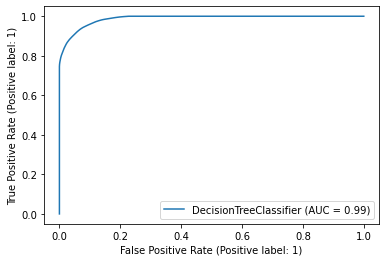

In [197]:
# Import required libraries
from sklearn.metrics import plot_roc_curve
# ROC curve for the test dataset
plot_roc_curve(dt_best, X_train_sm, y_train_sm)
plt.show()

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.236373 to fit



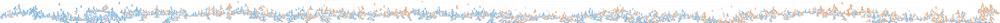

In [198]:
# visualization of decision tree
gph = get_dt_graph(dt_best)
Image(gph.create_png())

## 3.Random Forest Regressor With PCA

In [199]:
pc2 = PCA(n_components=10, random_state=42)
X_train_pca = pc2.fit_transform(X_train)
X_test_pca = pc2.transform(X_test)

In [200]:
cols=["PC"+str(i) for i in range(1,11)]
X_train_pca = pd.DataFrame(X_train_pca, columns=cols)
X_test_pca = pd.DataFrame(X_test_pca, columns=cols)

In [201]:
sm = SMOTE(random_state=42)
X_train_sm,y_train_sm = sm.fit_resample(X_train_pca,y_train)
print("Dimension of X_train_sm Shape:", X_train_sm.shape)
print("Dimension of y_train_sm Shape:", y_train_sm.shape)

Dimension of X_train_sm Shape: (37940, 10)
Dimension of y_train_sm Shape: (37940,)


In [202]:
# Import the required libraries
from sklearn.ensemble import RandomForestClassifier

# Random Forest model
rf = RandomForestClassifier(n_estimators=10, max_depth=4, max_features=5, random_state=100, oob_score=True)
rf.fit(X_train_sm, y_train_sm)

RandomForestClassifier(max_depth=4, max_features=5, n_estimators=10,
                       oob_score=True, random_state=100)

In [203]:
rf.oob_score_

0.708777016341592

In [204]:
sample_tree = rf.estimators_[5]

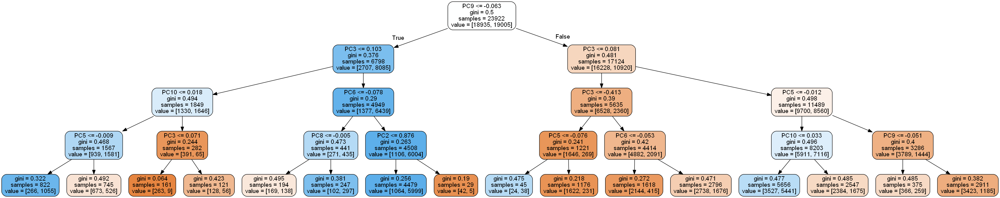

In [205]:
# visualization of random forest
dot_data = StringIO()
export_graphviz(sample_tree, out_file=dot_data, filled=True, rounded=True,
                feature_names=X_train_sm.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [206]:
# Predictions
# Predictions on train and test data set
y_train_pred_rd = rf.predict(X_train_sm)
y_test_pred_rd = rf.predict(X_test_pca)

In [207]:
rf.feature_importances_

array([0.01126373, 0.00797333, 0.15323099, 0.00425959, 0.27690036,
       0.04015946, 0.0098818 , 0.00387633, 0.44494595, 0.04750845])

In [208]:
imp_df = pd.DataFrame({
    "Varname": X_train_sm.columns,
    "Imp": rf.feature_importances_})

In [209]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
8,PC9,0.444946
4,PC5,0.276900
2,PC3,0.153231
9,PC10,0.047508
5,PC6,0.040159
0,PC1,0.011264
6,PC7,0.009882
1,PC2,0.007973
3,PC4,0.004260
7,PC8,0.003876


#### Hyper-parameter tuning for the Random Forest

In [210]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [211]:
params = {
    'max_depth': [2,3,5,10,20],
    'min_samples_leaf': [5,10,20,50,100,200],
    'n_estimators': [10, 25, 50, 100]
}

In [212]:
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

In [213]:
%%time
grid_search.fit(X_train_sm, y_train_sm)

Fitting 4 folds for each of 120 candidates, totalling 480 fits
Wall time: 10min 6s


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200],
                         'n_estimators': [10, 25, 50, 100]},
             scoring='accuracy', verbose=1)

In [214]:
grid_search.best_score_

0.8783869267264101

In [215]:
rf_best = grid_search.best_estimator_
rf_best.feature_importances_

array([0.07374017, 0.07051678, 0.09915453, 0.07886018, 0.15891626,
       0.08328083, 0.07666799, 0.07735938, 0.17651485, 0.10498903])

In [216]:
imp_df = pd.DataFrame({
    "Varname": X_train_sm.columns,
    "Imp": rf_best.feature_importances_
})

In [217]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
8,PC9,0.176515
4,PC5,0.158916
9,PC10,0.104989
2,PC3,0.099155
5,PC6,0.083281
3,PC4,0.078860
7,PC8,0.077359
6,PC7,0.076668
0,PC1,0.073740
1,PC2,0.070517


### Overall Metrics - Accuracy, Confusion Metrics, Sensitivity, Specificity on test set

In [218]:
# Confusion Matrix
confusion2_test = metrics.confusion_matrix(y_test, rf_best.predict(X_test_pca))
print("Confusion Matrix\n",confusion2_test)

Confusion Matrix
 [[7181 1040]
 [ 310  364]]


In [219]:
# Calculating model validation parameters
TP = confusion2_test[1,1] # true positive 
TN = confusion2_test[0,0] # true negatives
FP = confusion2_test[0,1] # false positives
FN = confusion2_test[1,0] # false negatives

metric4 = []
print("Statistics for model at cutoff value for Converted_prob > 0.55")
print("")
# Let's check the overall accuracy.
Accuracy = (round(metrics.accuracy_score(y_test, rf_best.predict(X_test_pca)),2))
metric4.append(Accuracy)
print('Overall_Accuracy :{0}'.format(round(metrics.accuracy_score(y_test, rf_best.predict(X_test_pca)),2)))

sensitivity = round(TP / float(TP+FN),2)
metric4.append(sensitivity)
# Let's see the sensitivity of our logistic regression model
print('Sensitivity :{0}'.format(sensitivity))

specificity = round(TN / float(TN+FP),2)
metric4.append(specificity)

# Let us calculate specificity
print('Specificity : {0}'.format(specificity))

# Calculate false postive rate - predicting lead when customer does not convert
print('False positive rate : {0}'.format(round(FP/ float(TN+FP),2)))

precision = round(TP / float(TP+FP),2)
metric4.append(precision)
# positive predictive value (Precision)
print ('Precision(Positive predictive Value) : {0}'.format(precision))

# Negative predictive value
print ('Negative predictive Value : {0}'.format(round(TN / float(TN+ FN),2)))

print("")

print("Sensitivity - Specificity : {0} , {1}".format(sensitivity,specificity))

print("Precision - Recall : {0} , {1}".format(precision,sensitivity))


F1 = (2*(precision*sensitivity)/(precision+sensitivity))
metric4.append(F1)
print("F1 score is : {0} ".format(2*(precision*sensitivity)/(precision+sensitivity)))

Statistics for model at cutoff value for Converted_prob > 0.55

Overall_Accuracy :0.85
Sensitivity :0.54
Specificity : 0.87
False positive rate : 0.13
Precision(Positive predictive Value) : 0.26
Negative predictive Value : 0.96

Sensitivity - Specificity : 0.54 , 0.87
Precision - Recall : 0.26 , 0.54
F1 score is : 0.35100000000000003 


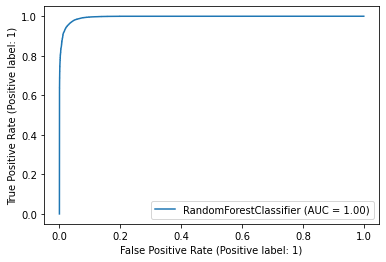

In [220]:
# Import required libraries
from sklearn.metrics import plot_roc_curve
# ROC curve for the test dataset
plot_roc_curve(rf_best, X_train_sm, y_train_sm)
plt.show()

## 4. Boosting With PCA

Let's now build model to predict the variable 'churn'. We'll try the XGBoost variant of boosting, tune the hyperparameters in the model and choose the best performance.

In [234]:
!pip install xgboost

In [221]:
pc2 = PCA(n_components=10, random_state=42)
X_train_pca = pc2.fit_transform(X_train)
X_test_pca = pc2.transform(X_test)

In [222]:
cols=["PC"+str(i) for i in range(1,11)]
X_train_pca = pd.DataFrame(X_train_pca, columns=cols)
X_test_pca = pd.DataFrame(X_test_pca, columns=cols)

In [223]:
sm = SMOTE(random_state=42)
X_train_sm,y_train_sm = sm.fit_resample(X_train_pca,y_train)
print("Dimension of X_train_sm Shape:", X_train_sm.shape)
print("Dimension of y_train_sm Shape:", y_train_sm.shape)

Dimension of X_train_sm Shape: (37940, 10)
Dimension of y_train_sm Shape: (37940,)


### XGBoost

In [224]:
import xgboost as xgb
from sklearn import metrics

xgclf = xgb.XGBClassifier()

xgclf.fit(X_train_sm, y_train_sm)

[22:57:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [225]:
# AUC of test and train data set
print('AUC on train data by XGBoost =', metrics.roc_auc_score(y_true=y_train_sm,
                                                              y_score=xgclf.predict_proba(X_train_sm)[:, 1]))
print('AUC on test data by XGBoost =', metrics.roc_auc_score(y_true=y_test,
                                                             y_score=xgclf.predict_proba(X_test_pca)[:, 1]))

AUC on train data by XGBoost = 0.9668354856001304
AUC on test data by XGBoost = 0.7614042635979292


In [226]:
xgb_model = xgb.XGBClassifier()
from sklearn import model_selection

# Default-Run of default-hyperparameters
parameters = {'learning_rate': [0.3],
              'max_depth': [6],
              'min_child_weight': [1],
              'n_estimators': [100]}

scorer = metrics.make_scorer(metrics.roc_auc_score,
                             greater_is_better=True,
                             needs_proba=True,
                             needs_threshold=False)

clf_xgb = model_selection.GridSearchCV(estimator=xgb_model,
                                       param_grid=parameters,
                                       n_jobs=-1,
                                       cv=3,
                                       scoring=scorer,
                                       refit=True)

clf_xgb.fit(X_train_sm, y_train_sm)

[22:58:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None,

#### XGBoost - Hyperparameter Tuning

In [227]:
# 1st-Run for best hyperparameters
# hyperparameter tuning with XGBoost

# 1st-Run for best hyperparameters
from xgboost import XGBClassifier

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train_sm, y_train_sm)       

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[22:58:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:58:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:58:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:58:33]

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=200, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [228]:
print(model_cv.best_params_)
print(model_cv.best_score_)
print(model_cv.best_estimator_)

{'learning_rate': 0.6, 'subsample': 0.9}
0.8494342234765879
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.6, max_delta_step=0, max_depth=2,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=200, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.9,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [229]:
final_model = xgb.XGBClassifier(learning_rate=0.3,
                                max_depth=6,
                                min_child_weight=1,
                                n_estimators=100)

final_model.fit(X_train_sm, y_train_sm)
print('AUC on train data by XGBoost =', metrics.roc_auc_score(y_true=y_train_sm,
                                                              y_score=final_model.predict_proba(X_train_sm)[:, 1]))

print('AUC on test data by XGBoost =', metrics.roc_auc_score(y_true=y_test,
                                                             y_score=final_model.predict_proba(X_test_pca)[:, 1]))

[22:59:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
AUC on train data by XGBoost = 0.9668354856001304
AUC on test data by XGBoost = 0.7614042635979292


### Overall Metrics - Accuracy, Confusion Metrics, Sensitivity, Specificity on test set

In [230]:
# Confusion Matrix
confusion2_test = metrics.confusion_matrix(y_test, final_model.predict(X_test_pca))
print("Confusion Matrix\n",confusion2_test)

Confusion Matrix
 [[6744 1477]
 [ 273  401]]


In [231]:
# Calculating model validation parameters
TP = confusion2_test[1,1] # true positive 
TN = confusion2_test[0,0] # true negatives
FP = confusion2_test[0,1] # false positives
FN = confusion2_test[1,0] # false negatives

metric5 = []
print("Statistics for model at cutoff value for Converted_prob > 0.55")
print("")
# Let's check the overall accuracy.
Accuracy = (round(metrics.accuracy_score(y_test, final_model.predict(X_test_pca)),2))
metric5.append(Accuracy)
print('Overall_Accuracy :{0}'.format(round(metrics.accuracy_score(y_test, final_model.predict(X_test_pca)),2)))
sensitivity = round(TP / float(TP+FN),2)
metric5.append(sensitivity)
# Let's see the sensitivity of our logistic regression model
print('Sensitivity :{0}'.format(sensitivity))

specificity = round(TN / float(TN+FP),2)
metric5.append(specificity)
# Let us calculate specificity
print('Specificity : {0}'.format(specificity))

# Calculate false postive rate - predicting lead when customer does not convert
print('False positive rate : {0}'.format(round(FP/ float(TN+FP),2)))

precision = round(TP / float(TP+FP),2)
metric5.append(precision)
# positive predictive value (Precision)
print ('Precision(Positive predictive Value) : {0}'.format(precision))

# Negative predictive value
print ('Negative predictive Value : {0}'.format(round(TN / float(TN+ FN),2)))

print("")

print("Sensitivity - Specificity : {0} , {1}".format(sensitivity,specificity))

print("Precision - Recall : {0} , {1}".format(precision,sensitivity))

F1 = (2*(precision*sensitivity)/(precision+sensitivity))
metric5.append(F1)
print("F1 score is : {0} ".format(2*(precision*sensitivity)/(precision+sensitivity)))

Statistics for model at cutoff value for Converted_prob > 0.55

Overall_Accuracy :0.8
Sensitivity :0.59
Specificity : 0.82
False positive rate : 0.18
Precision(Positive predictive Value) : 0.21
Negative predictive Value : 0.96

Sensitivity - Specificity : 0.59 , 0.82
Precision - Recall : 0.21 , 0.59
F1 score is : 0.30974999999999997 


# Recommendations

> ### Business Insights 

Less number of **high value customer** are churing but for last **6 month** no new high valued cusotmer is onboarded which is concerning and company should concentrate on that aspect. </span>

Customers with less than **4 years** of tenure are more likely to churn and company should concentrate more on that segment by rolling out new schems to that group. 

**Average revenue per user** seems to be most important feature in determining churn prediction. 

**Incoming** and **Outgoing Calls** on **romaing** for 8th month are strong indicators of churn behaviour

**Local Outgoing calls** made to landline , fixedline , mobile and call center provides a strong indicator of churn behaviour. 

Better 2G/3G area coverage where 2G/3G services are not good, it's strong indicator of churn behaviour.

> ### Model Insights 

In [232]:
# Creating a table which contain all the metrics

predictions_table = {'Metric': ['Accuracy','Sensitivity','Specificity','Precision','F1'], 
        'Logistic Regression without PCA': metric
        }

log_metric = pd.DataFrame(predictions_table ,columns = ['Metric', 'Logistic Regression without PCA'] )

log_pca_metric = pd.Series(metric2, name = 'Logistic Regression with PCA')
dt_metric = pd.Series(metric3, name = 'Decision Tree')
rf_metric = pd.Series(metric4, name = 'Random forest')
xgb_metric = pd.Series(metric5, name = 'XGBoost')

final_metric = pd.concat([log_metric, log_pca_metric, dt_metric, rf_metric, xgb_metric], axis = 1)

final_metric

,Metric,Logistic Regression without PCA,Logistic Regression with PCA,Decision Tree,Random forest,XGBoost
0,Accuracy,0.840000,0.71,0.78,0.850,0.80000
1,Sensitivity,0.810000,0.69,0.46,0.540,0.59000
2,Specificity,0.840000,0.71,0.81,0.870,0.82000
3,Precision,0.310000,0.16,0.16,0.260,0.21000
4,F1,0.448393,0.16,0.16,0.351,0.30975


**Random forest** with tuned hyperparameters produce best result on this dataset with 0.85 accuracy.

**Logistic Regression without PCA** also produce good accuracy with 0.84.

 **XGBoost** also produce apt accuracy of 0.80 with tuned hyperparameters.

 **As per our analysis Random forest and Logistic Regression without PCA produce best accuracy and models can be selected to predict churn data for future dataset or production.**

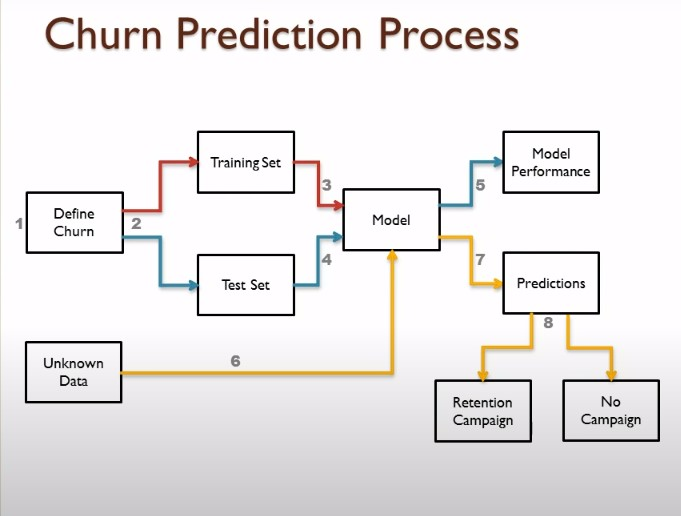